# Build a Conditional GAN

### Goals
In this notebook, you're going to make a conditional GAN in order to generate hand-written images of digits, conditioned on the digit to be generated (the class vector). This will let you choose what digit you want to generate.

You'll then do some exploration of the generated images to visualize what the noise and class vectors mean.  

### Learning Objectives
1.   Learn the technical difference between a conditional and unconditional GAN.
2.   Understand the distinction between the class and noise vector in a conditional GAN.



## Getting Started

For this assignment, you will be using the MNIST dataset again, but there's nothing stopping you from applying this generator code to produce images of animals conditioned on the species or pictures of faces conditioned on facial characteristics.

Note that this assignment requires no changes to the architectures of the generator or discriminator, only changes to the data passed to both. The generator will no longer take `z_dim` as an argument, but  `input_dim` instead, since you need to pass in both the noise and class vectors. In addition to good variable naming, this also means that you can use the generator and discriminator code you have previously written with different parameters.

You will begin by importing the necessary libraries and building the generator and discriminator.

#### Packages and Visualization

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for our testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28), nrow=5, show=True):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=nrow)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    if show:
        plt.show()

#### Generator and Noise

In [2]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        input_dim: the dimension of the input vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, input_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.input_dim = input_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(input_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, input_dim)
        '''
        x = noise.view(len(noise), self.input_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, input_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, input_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        input_dim: the dimension of the input vector, a scalar
        device: the device type
    '''
    return torch.randn(n_samples, input_dim, device=device)

#### Discriminator

In [3]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
      im_chan: the number of channels in the images, fitted for the dataset used, a scalar
            (MNIST is black-and-white, so 1 channel is your default)
      hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            self.make_disc_block(im_chan, hidden_dim),
            self.make_disc_block(hidden_dim, hidden_dim * 2),
            self.make_disc_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_disc_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a discriminator block of the DCGAN; 
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        disc_pred = self.disc(image)
        return disc_pred.view(len(disc_pred), -1)

## Class Input

In conditional GANs, the input vector for the generator will also need to include the class information. The class is represented using a one-hot encoded vector where its length is the number of classes and each index represents a class. The vector is all 0's and a 1 on the chosen class. Given the labels of multiple images (e.g. from a batch) and number of classes, please create one-hot vectors for each label. There is a class within the PyTorch functional library that can help you.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">get_one_hot_labels</font></code></b>
</font>
</summary>

1.   This code can be done in one line.
2.   The documentation for [F.one_hot](https://pytorch.org/docs/stable/nn.functional.html#torch.nn.functional.one_hot) may be helpful.

</details>


In [4]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_one_hot_labels

import torch.nn.functional as F
def get_one_hot_labels(labels, n_classes):
    '''
    Function for creating one-hot vectors for the labels, returns a tensor of shape (?, num_classes).
    Parameters:
        labels: tensor of labels from the dataloader, size (?)
        n_classes: the total number of classes in the dataset, an integer scalar
    '''
    #### START CODE HERE ####
    return F.one_hot(labels, n_classes)
    #### END CODE HERE ####

In [5]:
assert (
    get_one_hot_labels(
        labels=torch.Tensor([[0, 2, 1]]).long(),
        n_classes=3
    ).tolist() == 
    [[
      [1, 0, 0], 
      [0, 0, 1], 
      [0, 1, 0]
    ]]
)
# Check that the device of get_one_hot_labels matches the input device
if torch.cuda.is_available():
    assert str(get_one_hot_labels(torch.Tensor([[0]]).long().cuda(), 1).device).startswith("cuda")
    
print("Success!")

Success!


Next, you need to be able to concatenate the one-hot class vector to the noise vector before giving it to the generator. You will also need to do this when adding the class channels to the discriminator.

To do this, you will need to write a function that combines two vectors. Remember that you need to ensure that the vectors are the same type: floats. Again, you can look to the PyTorch library for help.
<details>
<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">combine_vectors</font></code></b>
</font>
</summary>

1.   This code can also be written in one line.
2.   The documentation for [torch.cat](https://pytorch.org/docs/master/generated/torch.cat.html) may be helpful.
3.   Specifically, you might want to look at what the `dim` argument of `torch.cat` does.

</details>


In [12]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: combine_vectors
def combine_vectors(x, y):
    '''
    Function for combining two vectors with shapes (n_samples, ?) and (n_samples, ?).
    Parameters:
      x: (n_samples, ?) the first vector. 
        In this assignment, this will be the noise vector of shape (n_samples, z_dim), 
        but you shouldn't need to know the second dimension's size.
      y: (n_samples, ?) the second vector.
        Once again, in this assignment this will be the one-hot class vector 
        with the shape (n_samples, n_classes), but you shouldn't assume this in your code.
    '''
    # Note: Make sure this function outputs a float no matter what inputs it receives
    #### START CODE HERE ####
    combined = torch.cat((x.float(),y.float()),dim=1)
    #### END CODE HERE ####
    return combined

In [13]:
combined = combine_vectors(torch.tensor([[1, 2], [3, 4]]), torch.tensor([[5, 6], [7, 8]]))
if torch.cuda.is_available():
    # Check that it doesn't break with cuda
    cuda_check = combine_vectors(torch.tensor([[1, 2], [3, 4]]).cuda(), torch.tensor([[5, 6], [7, 8]]).cuda())
    assert str(cuda_check.device).startswith("cuda")
# Check exact order of elements
assert torch.all(combined == torch.tensor([[1, 2, 5, 6], [3, 4, 7, 8]]))
# Tests that items are of float type
assert (type(combined[0][0].item()) == float)
# Check shapes
combined = combine_vectors(torch.randn(1, 4, 5), torch.randn(1, 8, 5));
assert tuple(combined.shape) == (1, 12, 5)
assert tuple(combine_vectors(torch.randn(1, 10, 12).long(), torch.randn(1, 20, 12).long()).shape) == (1, 30, 12)
# Check that the float transformation doesn't happen after the inputs are concatenated
assert tuple(combine_vectors(torch.randn(1, 10, 12).long(), torch.randn(1, 20, 12)).shape) == (1, 30, 12)
print("Success!")

Success!


## Training
Now you can start to put it all together!
First, you will define some new parameters:

*   mnist_shape: the number of pixels in each MNIST image, which has dimensions 28 x 28 and one channel (because it's black-and-white) so 1 x 28 x 28
*   n_classes: the number of classes in MNIST (10, since there are the digits from 0 to 9)

In [14]:
mnist_shape = (1, 28, 28)
n_classes = 10

And you also include the same parameters from previous assignments:

  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type


In [15]:
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.0002
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=False, transform=transform),
    batch_size=batch_size,
    shuffle=True)

Then, you can initialize your generator, discriminator, and optimizers. To do this, you will need to update the input dimensions for both models. For the generator, you will need to calculate the size of the input vector; recall that for conditional GANs, the generator's input is the noise vector concatenated with the class vector. For the discriminator, you need to add a channel for every class.

In [18]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_input_dimensions
def get_input_dimensions(z_dim, mnist_shape, n_classes):
    '''
    Function for getting the size of the conditional input dimensions 
    from z_dim, the image shape, and number of classes.
    Parameters:
        z_dim: the dimension of the noise vector, a scalar
        mnist_shape: the shape of each MNIST image as (C, W, H), which is (1, 28, 28)
        n_classes: the total number of classes in the dataset, an integer scalar
                (10 for MNIST)
    Returns: 
        generator_input_dim: the input dimensionality of the conditional generator, 
                          which takes the noise and class vectors
        discriminator_im_chan: the number of input channels to the discriminator
                            (e.g. C x 28 x 28 for MNIST)
    '''
    #### START CODE HERE ####
    generator_input_dim = z_dim + n_classes
    discriminator_im_chan = mnist_shape[0] + n_classes
    #### END CODE HERE ####
    return generator_input_dim, discriminator_im_chan

In [19]:
def test_input_dims():
    gen_dim, disc_dim = get_input_dimensions(23, (12, 23, 52), 9)
    assert gen_dim == 32
    assert disc_dim == 21
test_input_dims()
print("Success!")

Success!


In [20]:
generator_input_dim, discriminator_im_chan = get_input_dimensions(z_dim, mnist_shape, n_classes)

gen = Generator(input_dim=generator_input_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator(im_chan=discriminator_im_chan).to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)

Now to train, you would like both your generator and your discriminator to know what class of image should be generated. There are a few locations where you will need to implement code.

For example, if you're generating a picture of the number "1", you would need to:
  
1.   Tell that to the generator, so that it knows it should be generating a "1"
2.   Tell that to the discriminator, so that it knows it should be looking at a "1". If the discriminator is told it should be looking at a 1 but sees something that's clearly an 8, it can guess that it's probably fake

There are no explicit unit tests here -- if this block of code runs and you don't change any of the other variables, then you've done it correctly!

Congratulations! If you've gotten here, it's working. Please let this train until you're happy with how the generated numbers look, and then go on to the exploration!



Epoch 1, step 500: Generator loss: 2.3879863389730454, discriminator loss: 0.23636391157284378


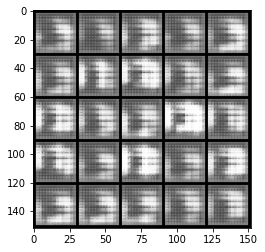

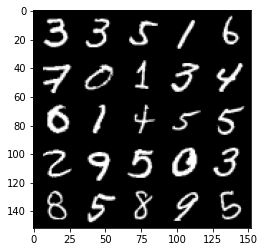

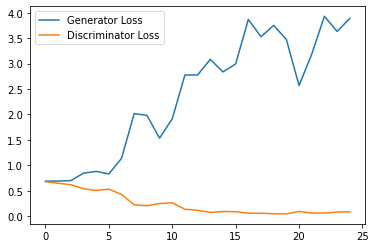

Epoch 2, step 1000: Generator loss: 4.382971675872803, discriminator loss: 0.058621392315253616


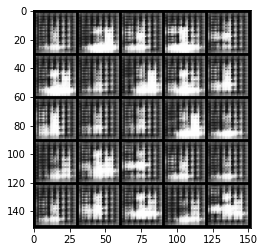

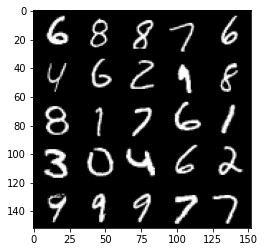

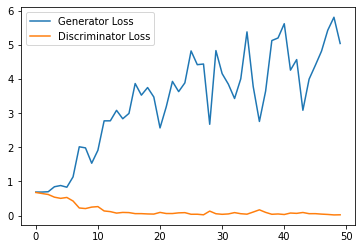

Epoch 3, step 1500: Generator loss: 4.88804176235199, discriminator loss: 0.03247156290989369


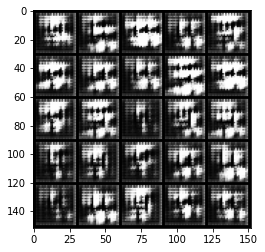

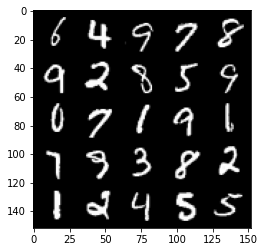

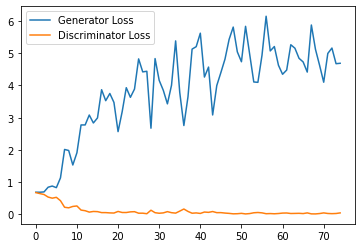

Epoch 4, step 2000: Generator loss: 4.214089390277863, discriminator loss: 0.07145862989127635


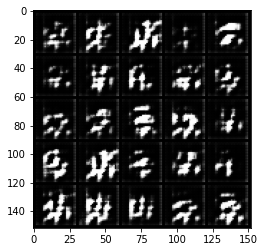

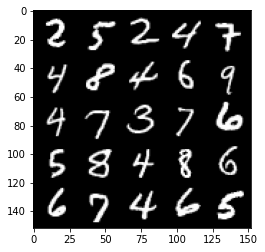

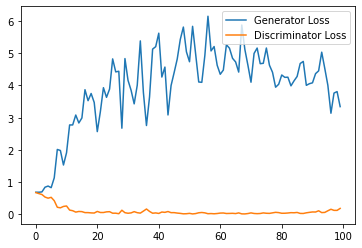

Epoch 5, step 2500: Generator loss: 3.0868795595169067, discriminator loss: 0.18975170104205608


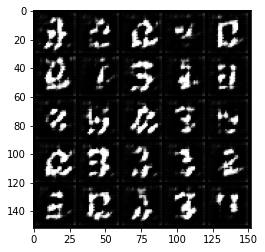

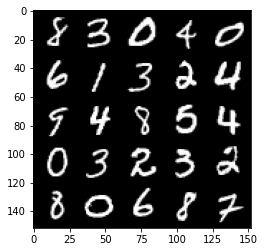

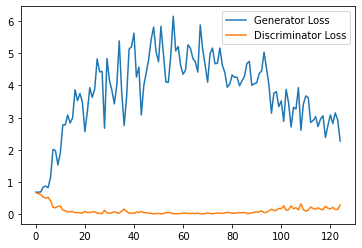

Epoch 6, step 3000: Generator loss: 2.679295227766037, discriminator loss: 0.23061617214232683


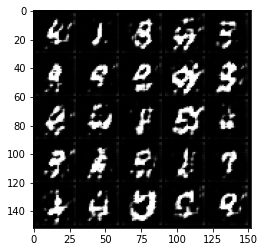

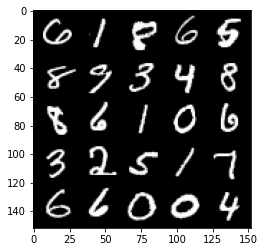

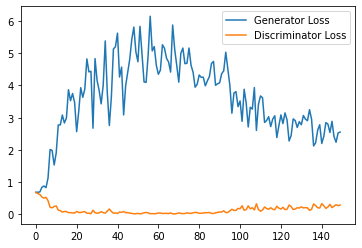

Epoch 7, step 3500: Generator loss: 2.4551156747341154, discriminator loss: 0.28027299684286117


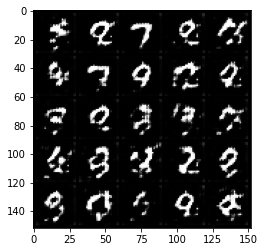

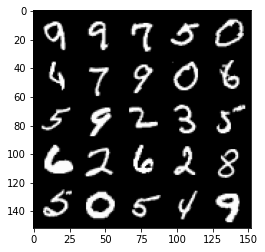

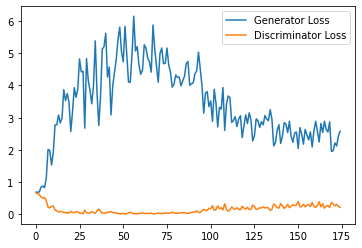

Epoch 8, step 4000: Generator loss: 2.2031465620994566, discriminator loss: 0.2928256307244301


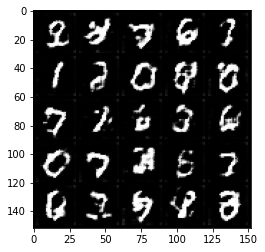

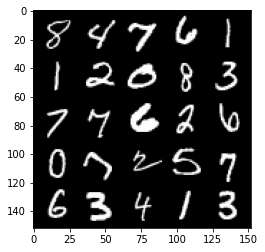

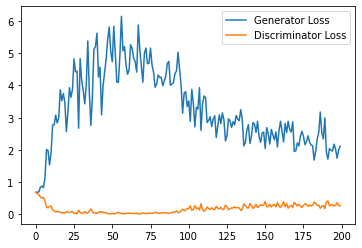

Epoch 9, step 4500: Generator loss: 1.9874444341659545, discriminator loss: 0.33752925658226013


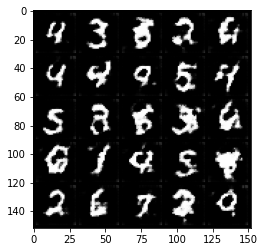

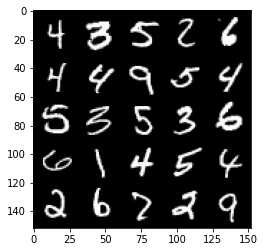

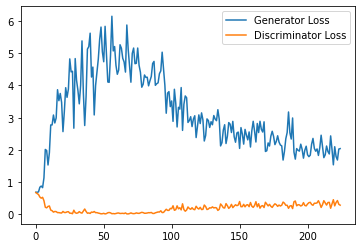

Epoch 10, step 5000: Generator loss: 1.8667932331562043, discriminator loss: 0.37291839823126793


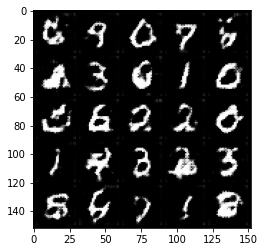

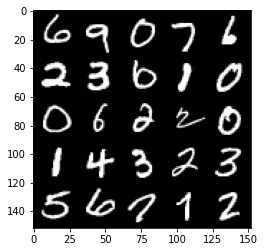

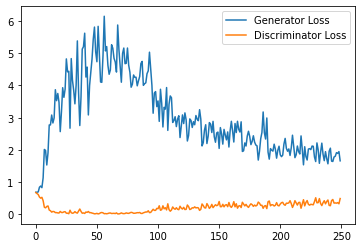

Epoch 11, step 5500: Generator loss: 1.9507198917865753, discriminator loss: 0.3996628210544586


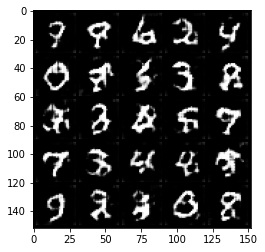

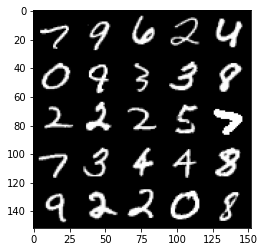

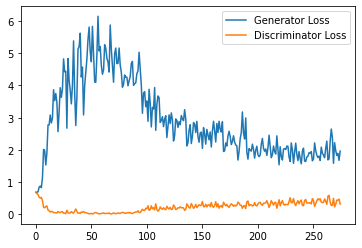

Epoch 12, step 6000: Generator loss: 1.7109997427463532, discriminator loss: 0.40859278178215025


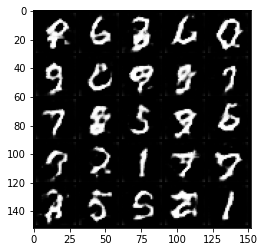

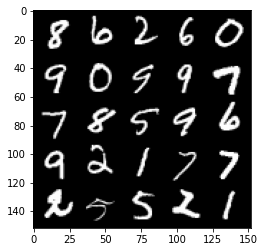

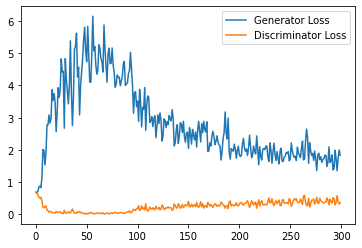

Epoch 13, step 6500: Generator loss: 1.597466319680214, discriminator loss: 0.42274779272079466


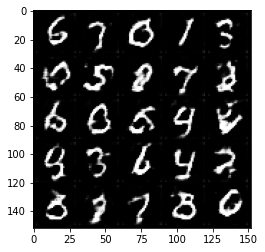

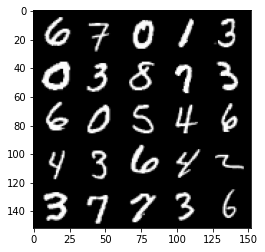

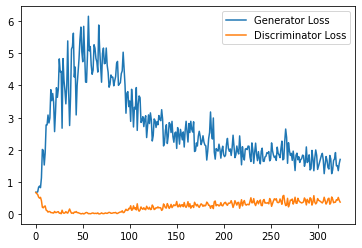

Epoch 14, step 7000: Generator loss: 1.5761601765155793, discriminator loss: 0.4552903031110764


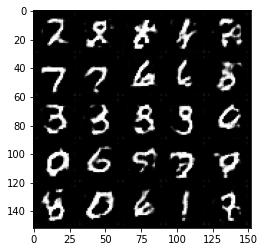

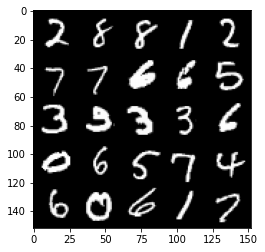

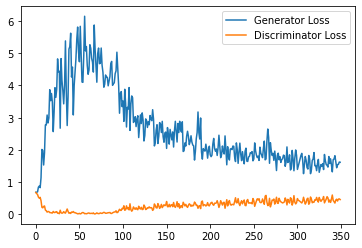

Epoch 15, step 7500: Generator loss: 1.5501764285564423, discriminator loss: 0.47391841769218446


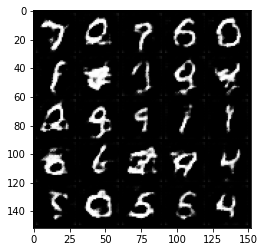

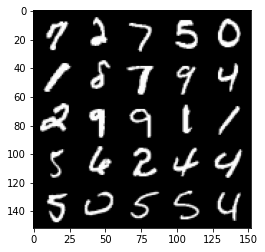

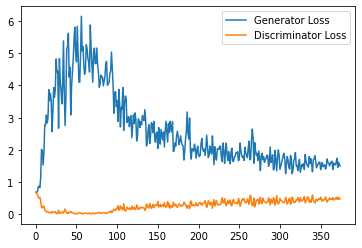

Epoch 17, step 8000: Generator loss: 1.4557367057800292, discriminator loss: 0.48559068006277084


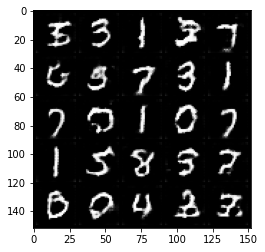

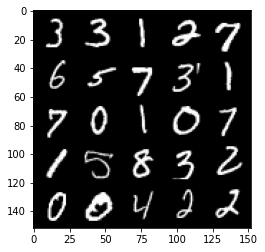

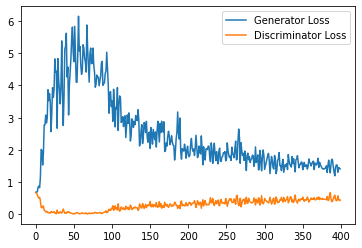

Epoch 18, step 8500: Generator loss: 1.3571335495710373, discriminator loss: 0.5217756479978561


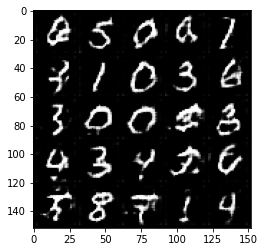

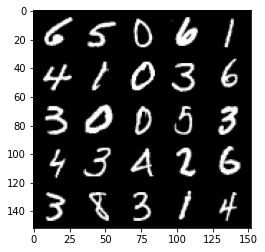

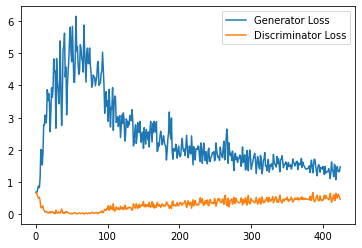

Epoch 19, step 9000: Generator loss: 1.3025110312700272, discriminator loss: 0.523123452782631


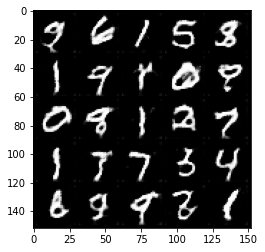

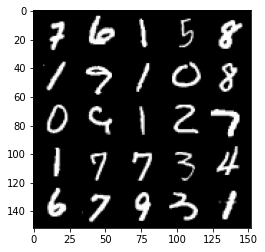

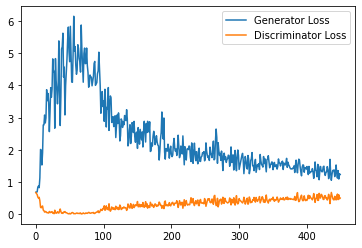

Epoch 20, step 9500: Generator loss: 1.222937140583992, discriminator loss: 0.5445679813623429


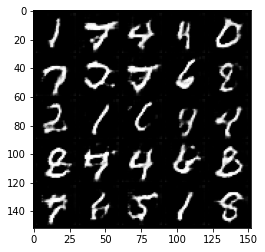

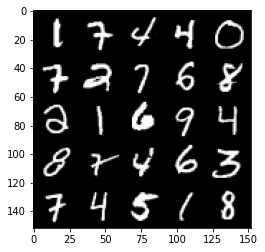

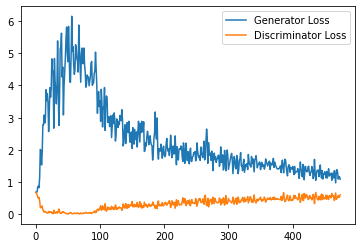

Epoch 21, step 10000: Generator loss: 1.299431124806404, discriminator loss: 0.5330899922847748


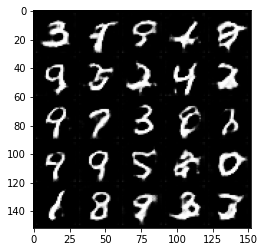

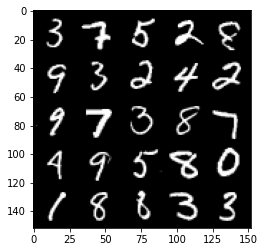

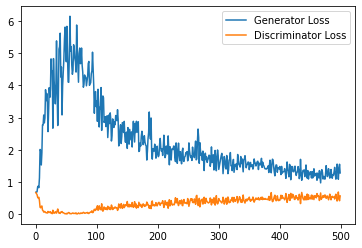

Epoch 22, step 10500: Generator loss: 1.277248450756073, discriminator loss: 0.5315653567314148


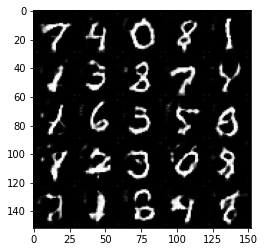

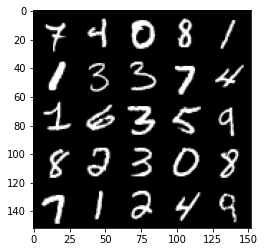

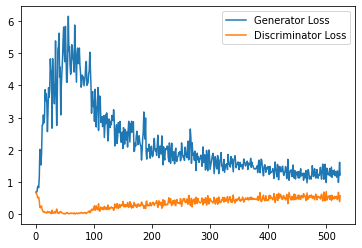

Epoch 23, step 11000: Generator loss: 1.2685073847770691, discriminator loss: 0.5417970974445343


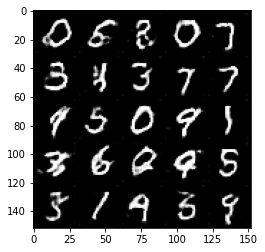

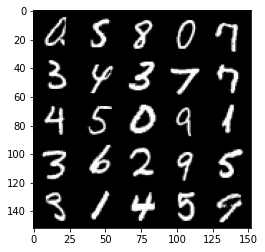

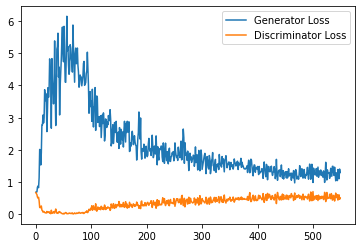

Epoch 24, step 11500: Generator loss: 1.2159218236207963, discriminator loss: 0.5587266145944595


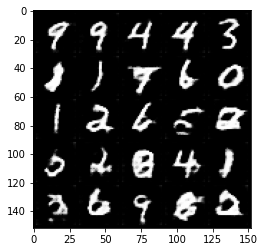

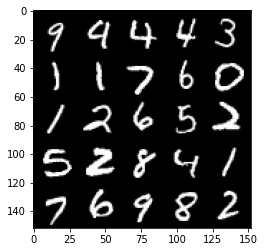

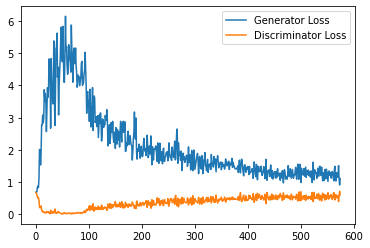

Epoch 25, step 12000: Generator loss: 1.1492701226472855, discriminator loss: 0.5505455123186112


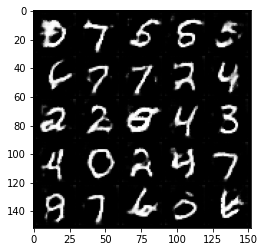

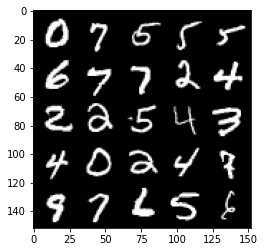

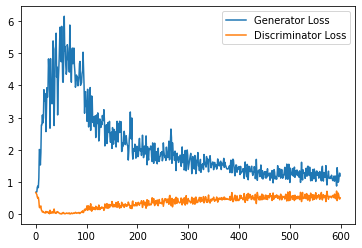

Epoch 26, step 12500: Generator loss: 1.1523861105442048, discriminator loss: 0.5632608339190484


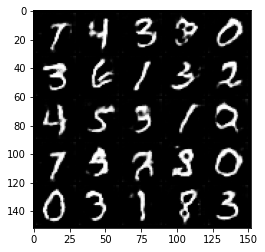

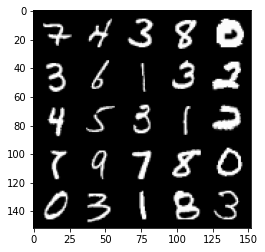

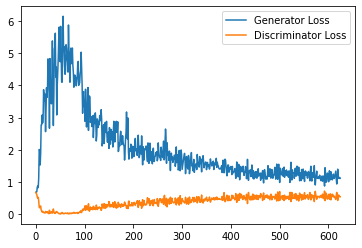

Epoch 27, step 13000: Generator loss: 1.1482479746341705, discriminator loss: 0.5707091300487518


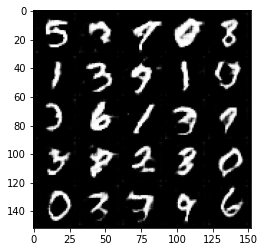

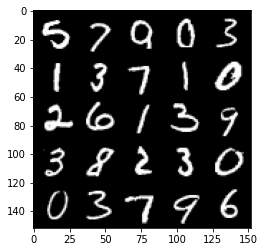

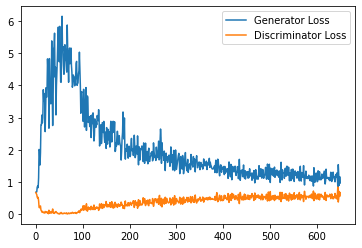

Epoch 28, step 13500: Generator loss: 1.1630282238721847, discriminator loss: 0.5580608857274055


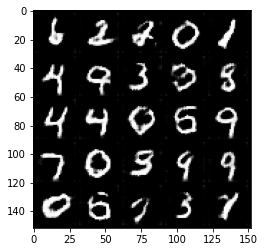

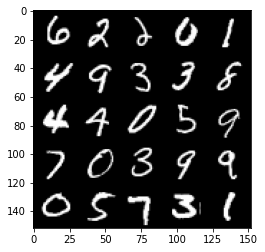

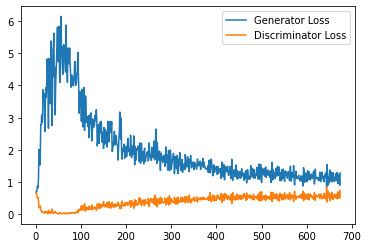

Epoch 29, step 14000: Generator loss: 1.1328300364017487, discriminator loss: 0.5580781271457672


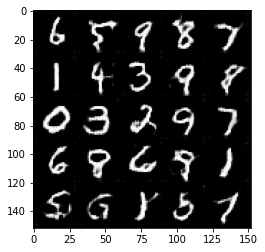

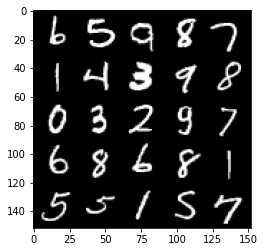

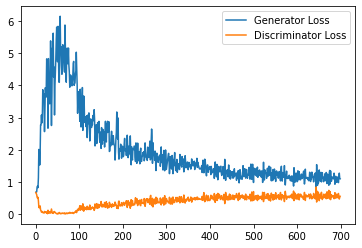

Epoch 30, step 14500: Generator loss: 1.1269061571359635, discriminator loss: 0.5644896134138108


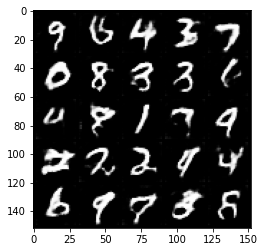

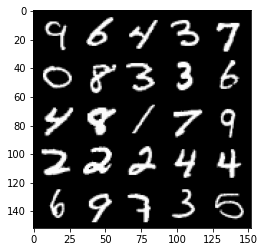

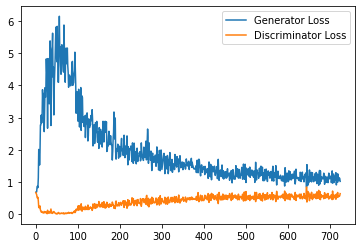

Epoch 31, step 15000: Generator loss: 1.1103378709554672, discriminator loss: 0.570732812166214


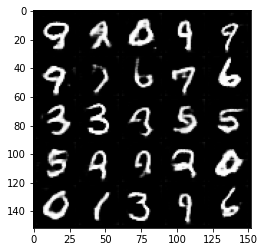

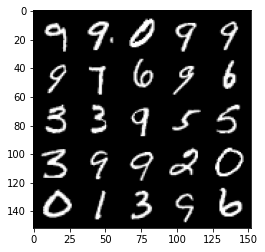

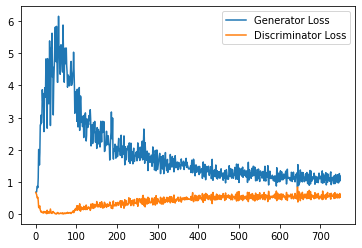

Epoch 33, step 15500: Generator loss: 1.0807553539276122, discriminator loss: 0.5733784223794938


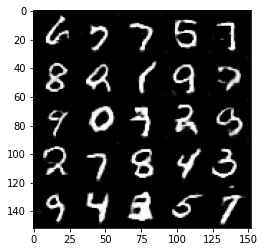

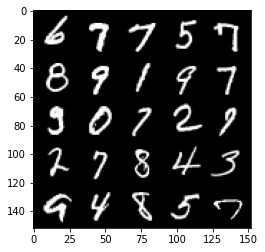

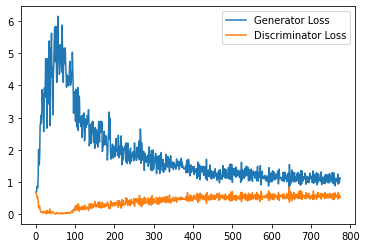

Epoch 34, step 16000: Generator loss: 1.0921224957704545, discriminator loss: 0.5723701601624489


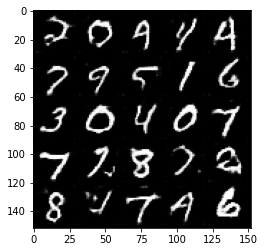

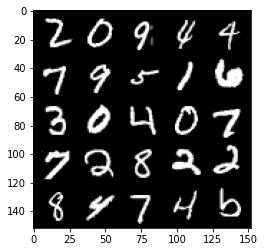

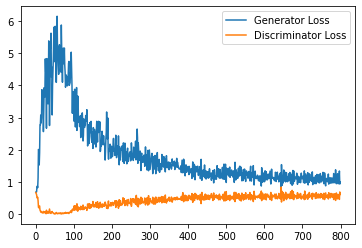

Epoch 35, step 16500: Generator loss: 1.0951108173131943, discriminator loss: 0.5756893845200539


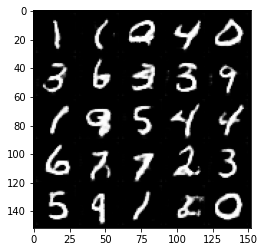

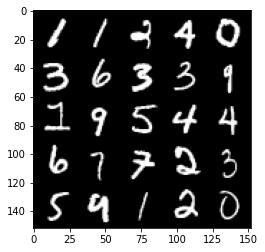

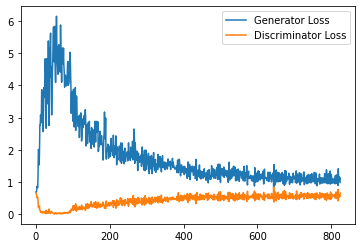

Epoch 36, step 17000: Generator loss: 1.1111387850046157, discriminator loss: 0.579978810608387


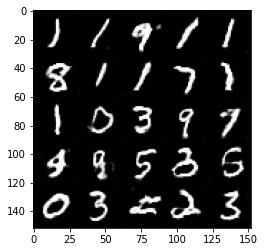

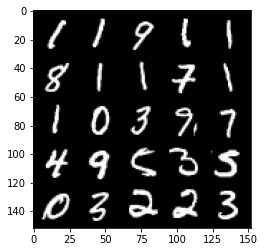

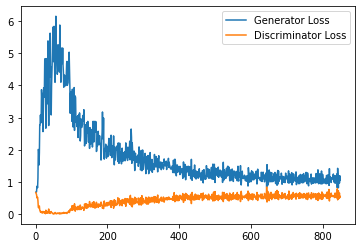

Epoch 37, step 17500: Generator loss: 1.066114810705185, discriminator loss: 0.5834838451743126


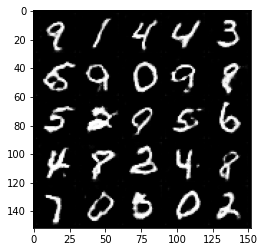

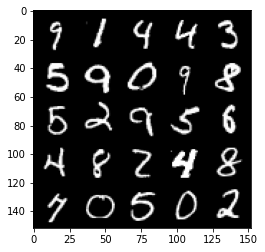

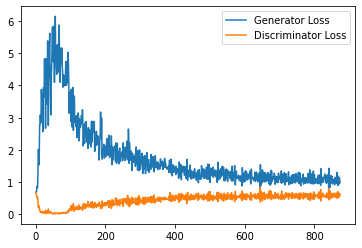

Epoch 38, step 18000: Generator loss: 1.0648882595300675, discriminator loss: 0.5716310020089149


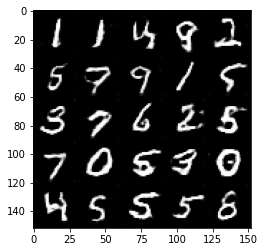

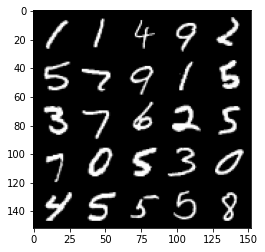

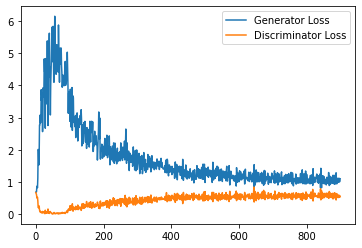

Epoch 39, step 18500: Generator loss: 1.0946148780584335, discriminator loss: 0.5908029969930649


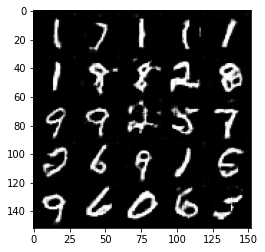

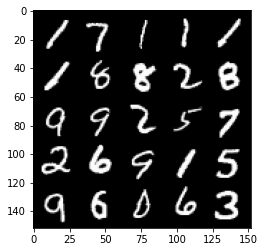

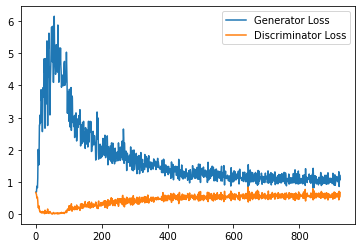

Epoch 40, step 19000: Generator loss: 1.0959141219854356, discriminator loss: 0.5843728634119034


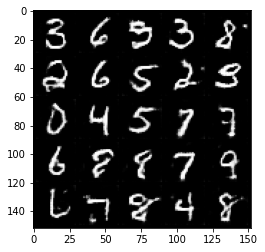

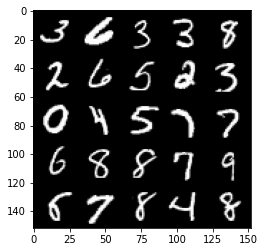

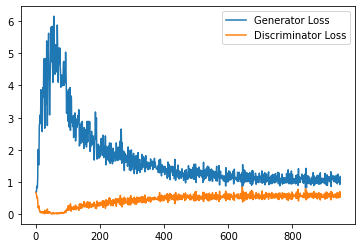

Epoch 41, step 19500: Generator loss: 1.0559341019392015, discriminator loss: 0.5908559720516204


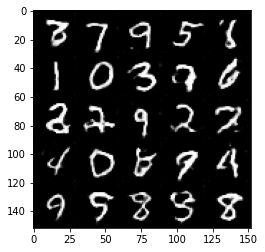

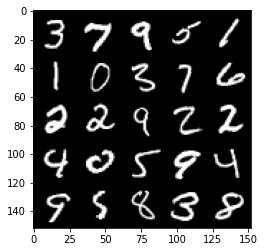

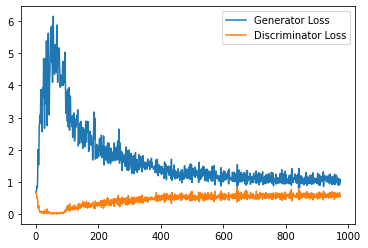

Epoch 42, step 20000: Generator loss: 1.0158378108739854, discriminator loss: 0.5911299539804459


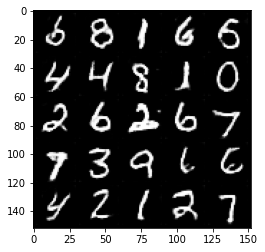

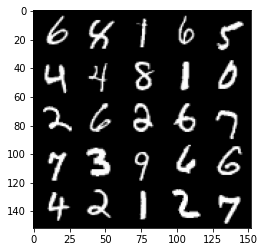

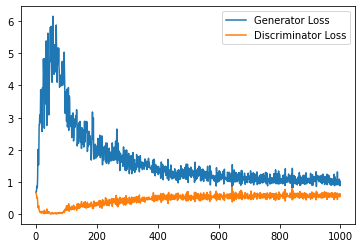

Epoch 43, step 20500: Generator loss: 1.0258254636526107, discriminator loss: 0.5975860638022423


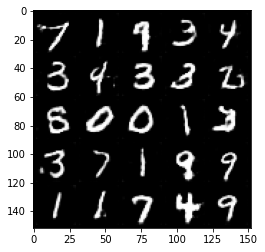

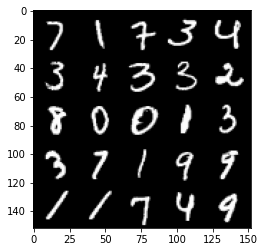

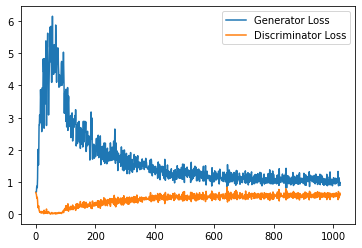

Epoch 44, step 21000: Generator loss: 1.0101027389764785, discriminator loss: 0.5933797781467438


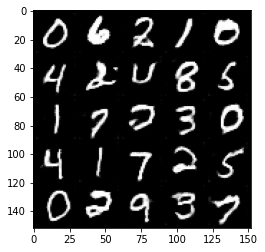

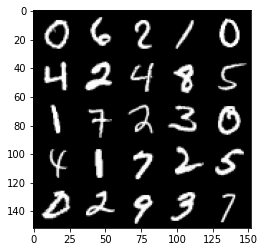

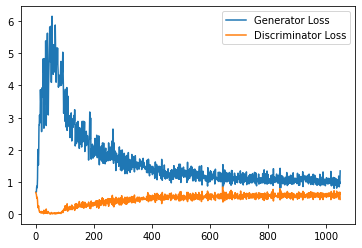

Epoch 45, step 21500: Generator loss: 1.0299744597673417, discriminator loss: 0.5957778580784797


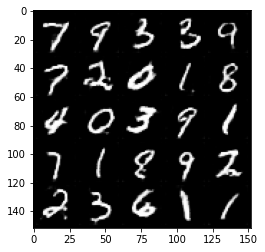

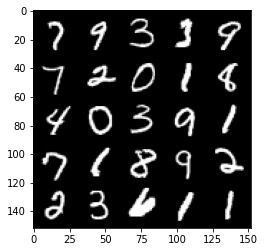

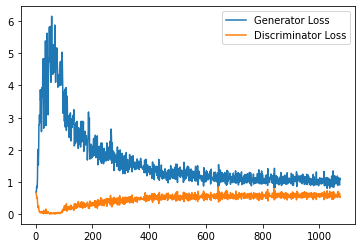

Epoch 46, step 22000: Generator loss: 1.0010647815465927, discriminator loss: 0.6027278975844383


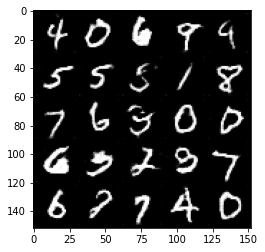

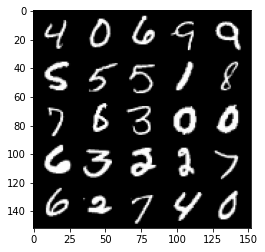

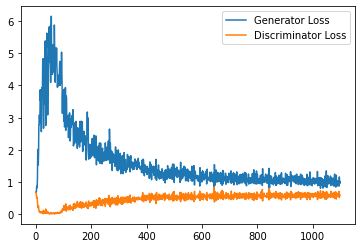

Epoch 47, step 22500: Generator loss: 1.014796542406082, discriminator loss: 0.6040999672412872


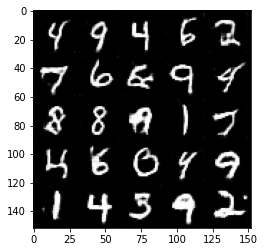

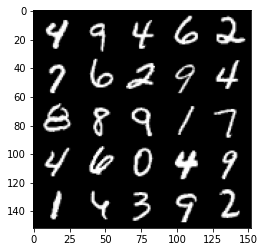

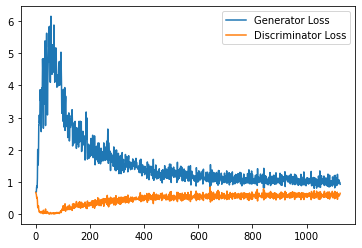

Epoch 49, step 23000: Generator loss: 1.0241679252386093, discriminator loss: 0.5976467489004135


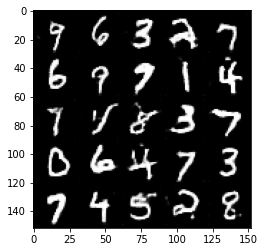

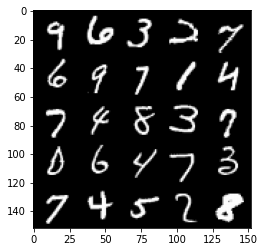

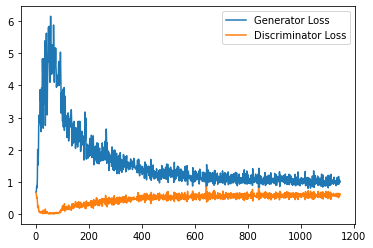

Epoch 50, step 23500: Generator loss: 1.0189502164125444, discriminator loss: 0.5906941177845001


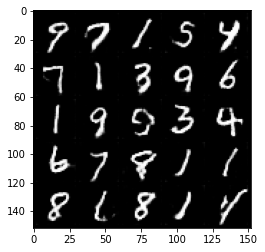

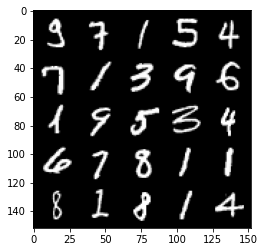

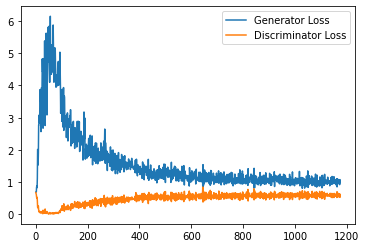

Epoch 51, step 24000: Generator loss: 1.0021086119413376, discriminator loss: 0.6107437075376511


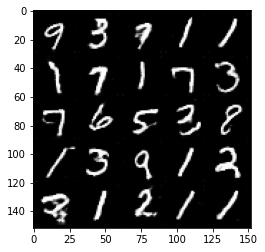

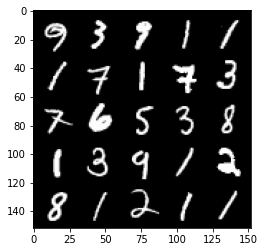

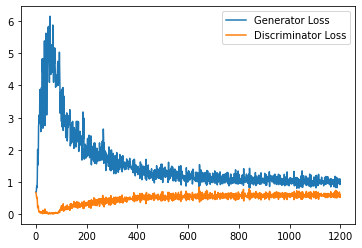

Epoch 52, step 24500: Generator loss: 0.9924686658382416, discriminator loss: 0.6106498337388039


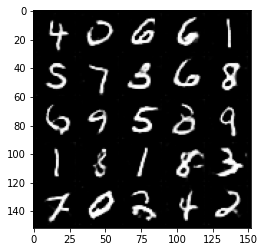

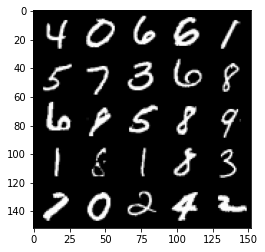

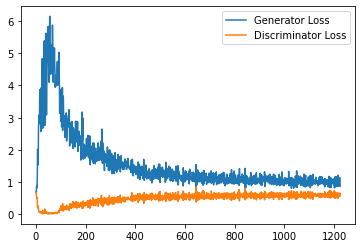

Epoch 53, step 25000: Generator loss: 0.9734772242307663, discriminator loss: 0.6114515554308891


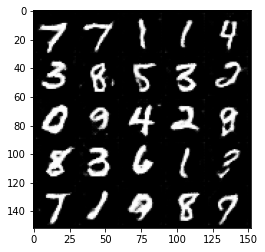

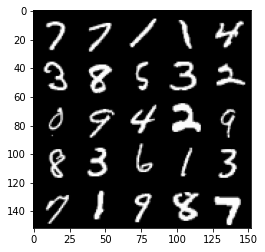

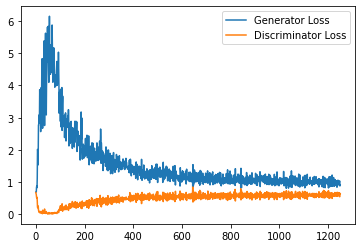

Epoch 54, step 25500: Generator loss: 0.9606973732709885, discriminator loss: 0.6056317400932312


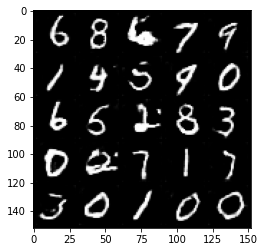

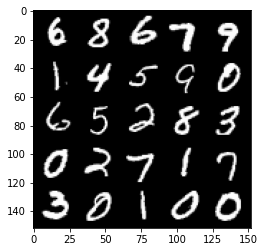

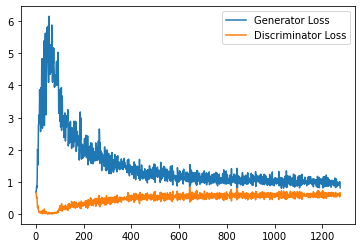

Epoch 55, step 26000: Generator loss: 0.9752779259681702, discriminator loss: 0.6072811021804809


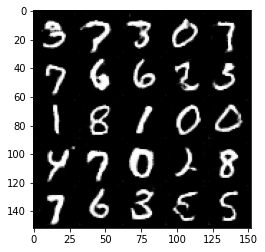

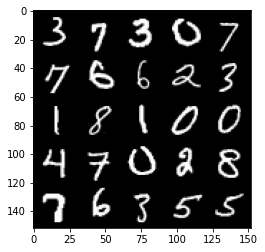

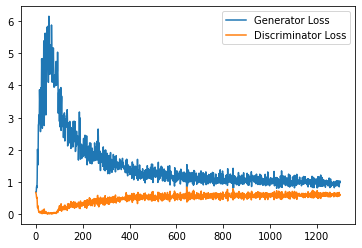

Epoch 56, step 26500: Generator loss: 0.982063758611679, discriminator loss: 0.6134956288337707


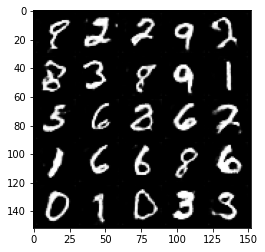

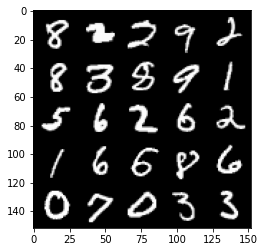

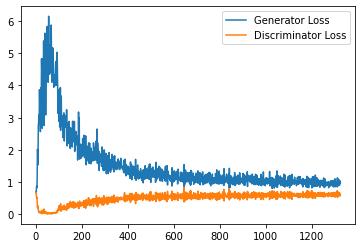

Epoch 57, step 27000: Generator loss: 0.989732929110527, discriminator loss: 0.6145866566896439


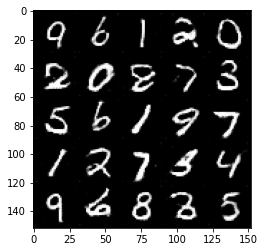

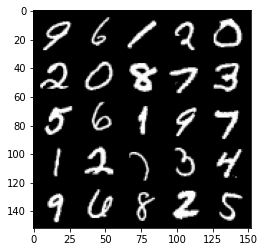

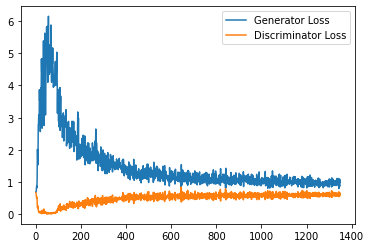

Epoch 58, step 27500: Generator loss: 0.9784557628631592, discriminator loss: 0.6147403137087822


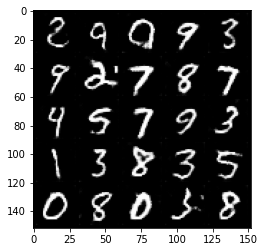

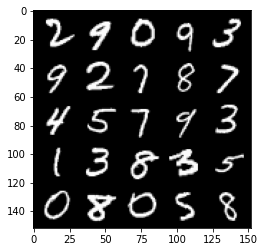

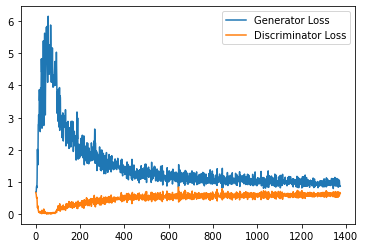

Epoch 59, step 28000: Generator loss: 0.9452946397066117, discriminator loss: 0.611013092637062


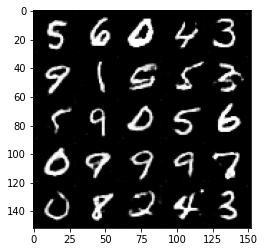

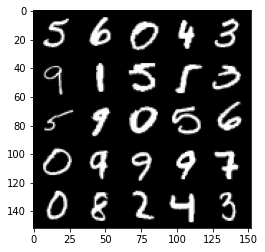

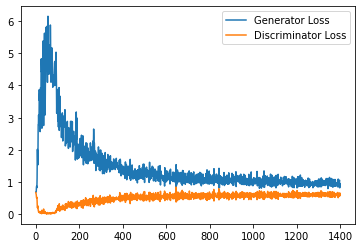

Epoch 60, step 28500: Generator loss: 0.9726213926076889, discriminator loss: 0.6205473161935806


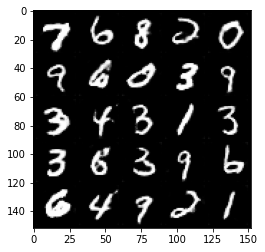

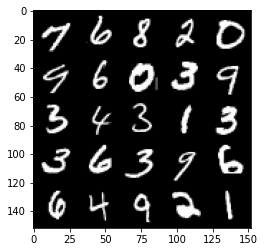

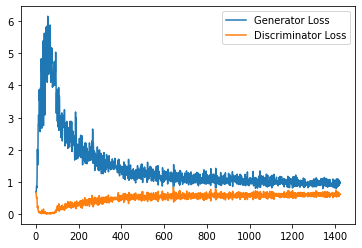

Epoch 61, step 29000: Generator loss: 0.9605785274505615, discriminator loss: 0.6142134891152382


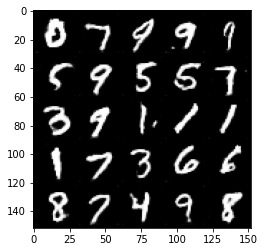

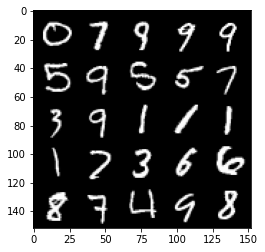

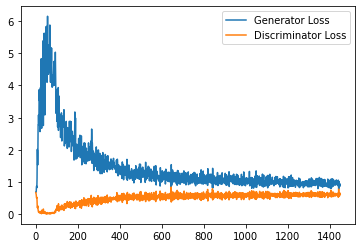

Epoch 62, step 29500: Generator loss: 0.9542244527339935, discriminator loss: 0.6152775025367737


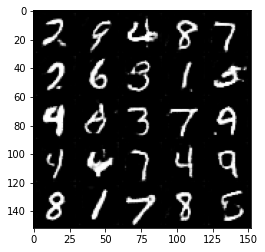

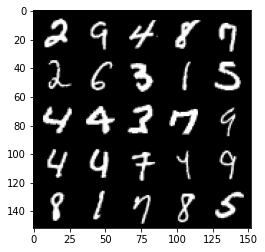

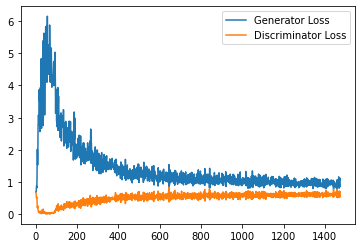

Epoch 63, step 30000: Generator loss: 0.9683402965068817, discriminator loss: 0.6209909682273864


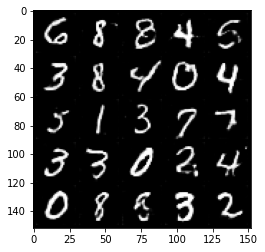

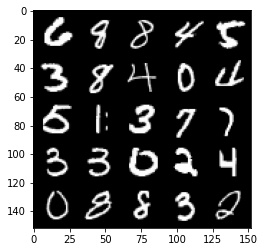

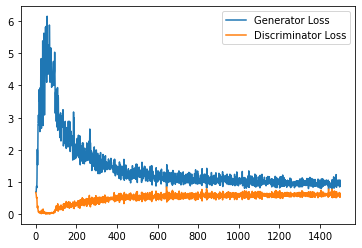

Epoch 65, step 30500: Generator loss: 0.935611932516098, discriminator loss: 0.61914090269804


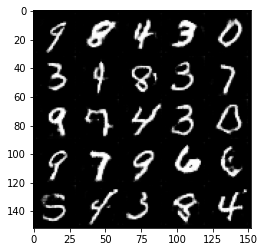

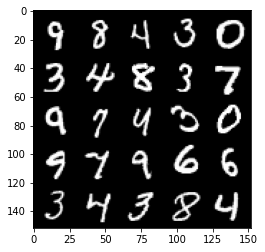

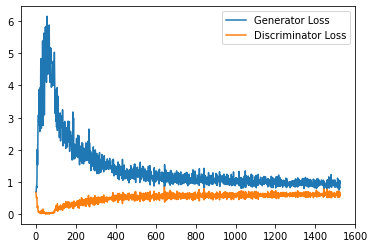

Epoch 66, step 31000: Generator loss: 0.9442774202227593, discriminator loss: 0.6181469145417213


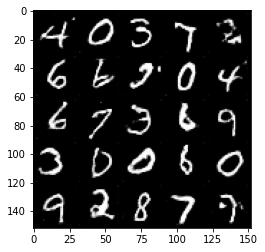

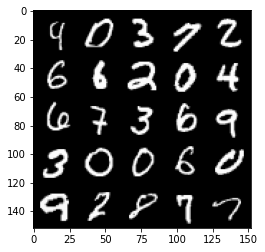

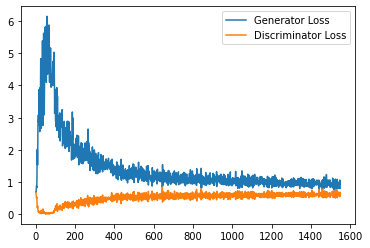

Epoch 67, step 31500: Generator loss: 0.935766888976097, discriminator loss: 0.6157291397452355


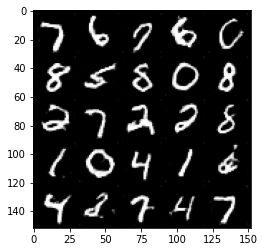

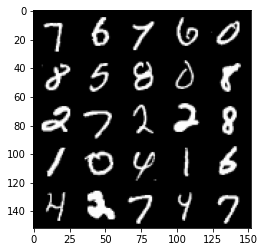

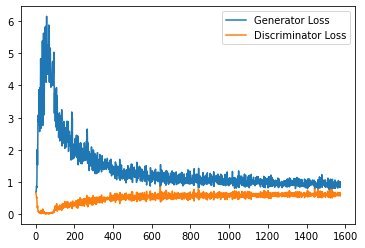

Epoch 68, step 32000: Generator loss: 0.9633795320987701, discriminator loss: 0.6143683142662049


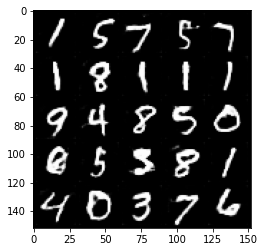

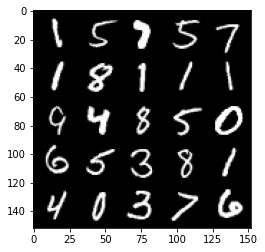

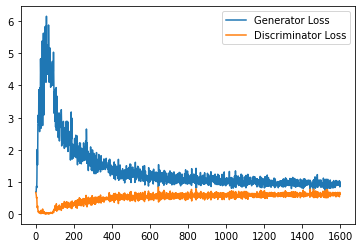

Epoch 69, step 32500: Generator loss: 0.9545172517299652, discriminator loss: 0.6131522676944733


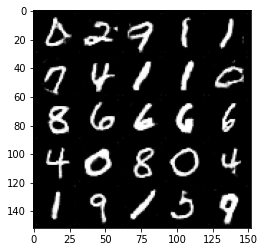

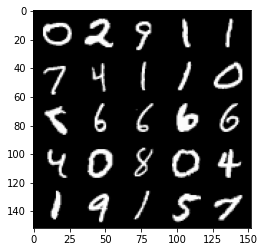

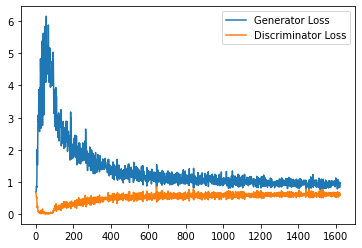

Epoch 70, step 33000: Generator loss: 0.9389325760602951, discriminator loss: 0.6158107169270516


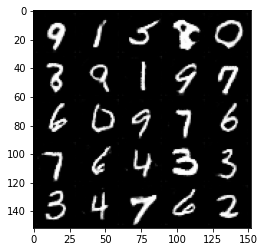

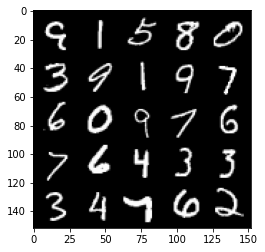

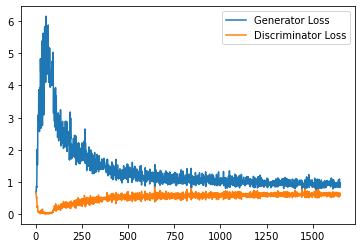

Epoch 71, step 33500: Generator loss: 0.9728307665586472, discriminator loss: 0.6121327092647553


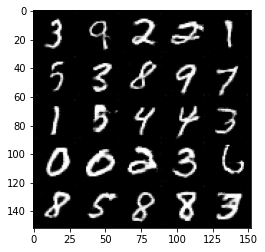

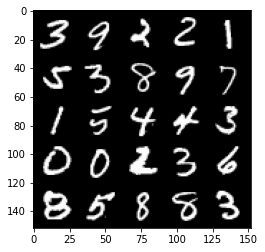

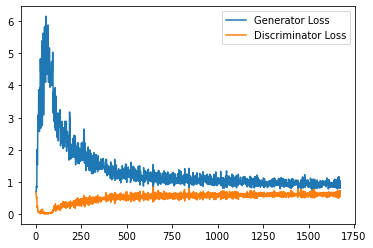

Epoch 72, step 34000: Generator loss: 0.9496395927667618, discriminator loss: 0.6138912628293037


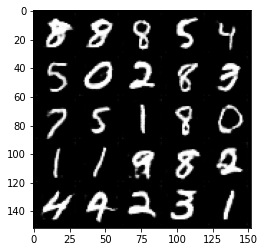

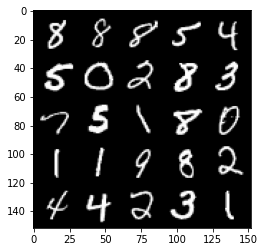

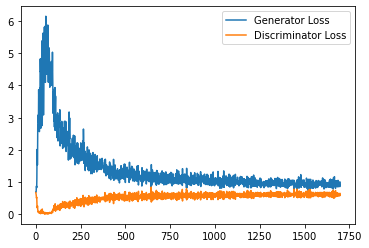

Epoch 73, step 34500: Generator loss: 0.9268203518390655, discriminator loss: 0.6120962393879891


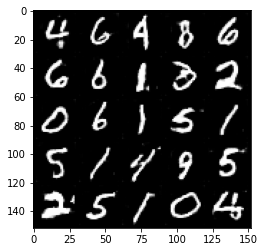

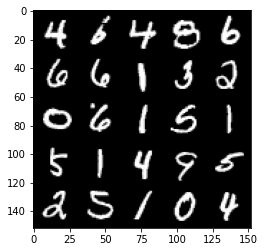

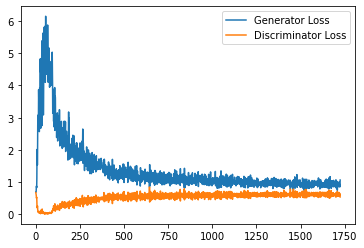

Epoch 74, step 35000: Generator loss: 0.9689869709014892, discriminator loss: 0.6121961659193039


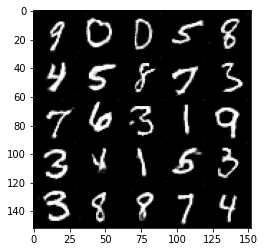

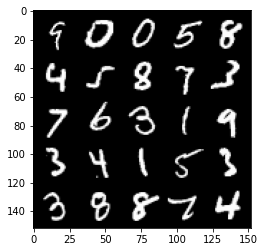

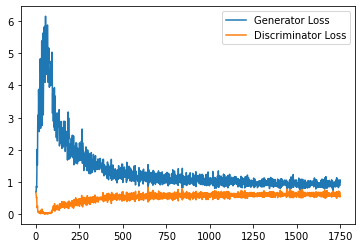

Epoch 75, step 35500: Generator loss: 0.9655038899183274, discriminator loss: 0.6192727470993996


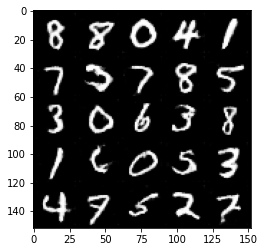

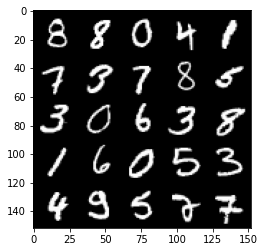

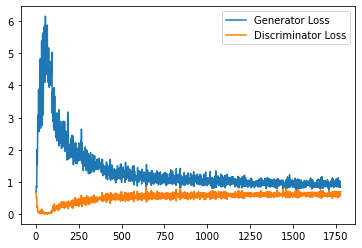

Epoch 76, step 36000: Generator loss: 0.9377176475524902, discriminator loss: 0.6148976300954818


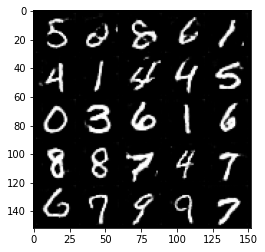

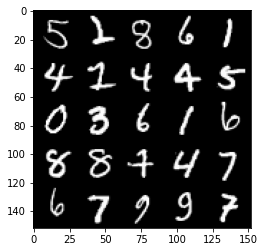

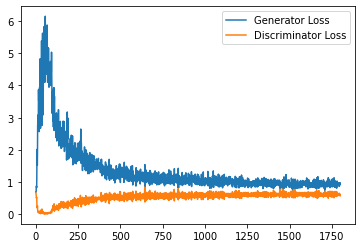

Epoch 77, step 36500: Generator loss: 0.9358880056142806, discriminator loss: 0.6178823992609978


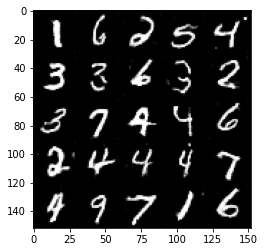

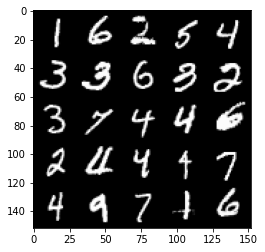

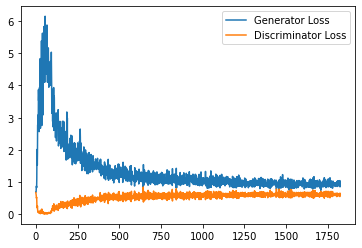

Epoch 78, step 37000: Generator loss: 0.9459275189638138, discriminator loss: 0.6171237680315972


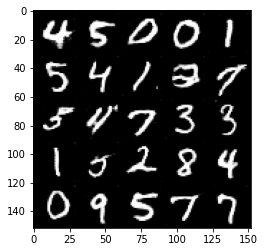

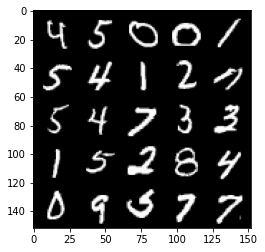

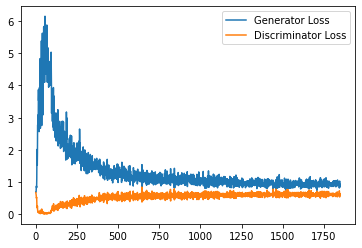

Epoch 79, step 37500: Generator loss: 0.9273102985620498, discriminator loss: 0.6156171768903732


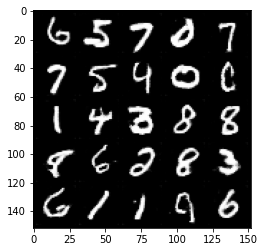

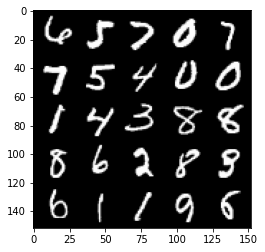

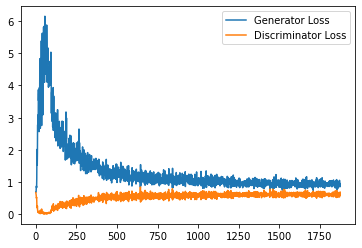

Epoch 81, step 38000: Generator loss: 0.9506211041212081, discriminator loss: 0.6102104147076607


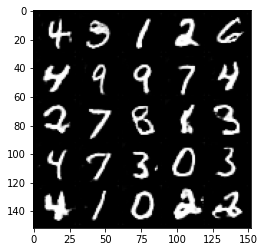

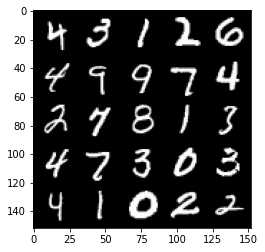

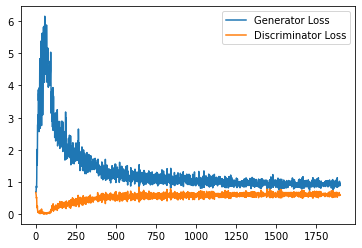

Epoch 82, step 38500: Generator loss: 0.9528115237951279, discriminator loss: 0.6091915073990822


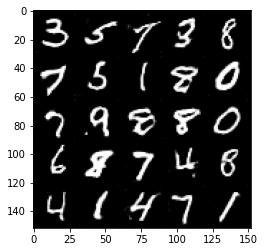

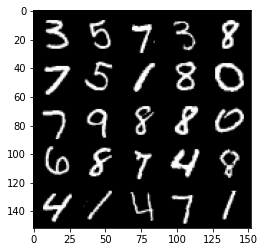

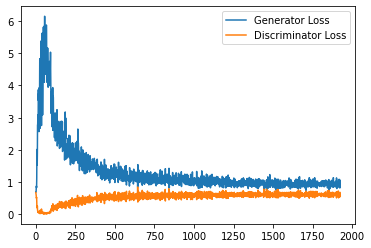

Epoch 83, step 39000: Generator loss: 0.948031844496727, discriminator loss: 0.6150270594954491


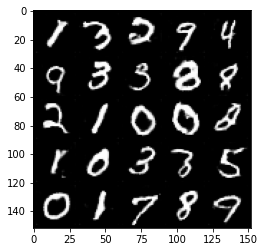

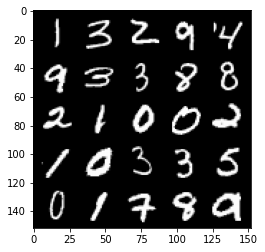

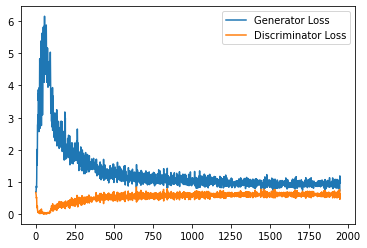

Epoch 84, step 39500: Generator loss: 0.9443299797773361, discriminator loss: 0.6170155047178268


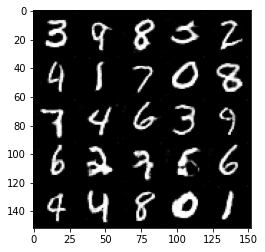

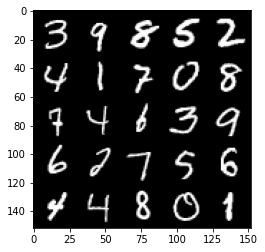

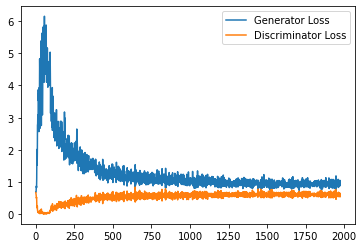

Epoch 85, step 40000: Generator loss: 0.9507223695516587, discriminator loss: 0.6128278977870941


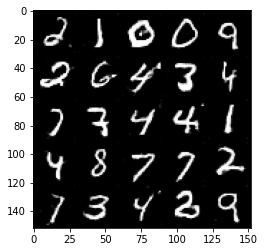

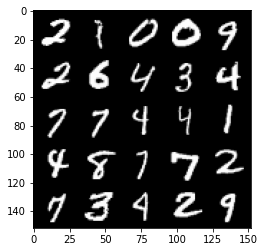

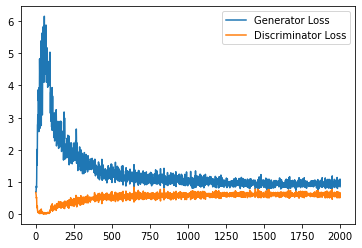

Epoch 86, step 40500: Generator loss: 0.9585095351934433, discriminator loss: 0.6171128880977631


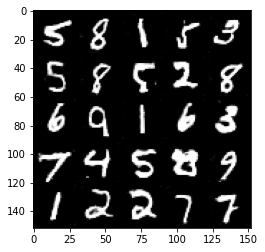

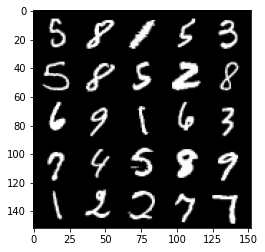

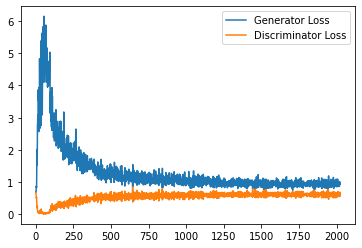

Epoch 87, step 41000: Generator loss: 0.9485550363063813, discriminator loss: 0.611692331314087


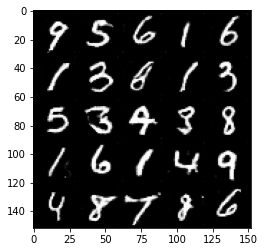

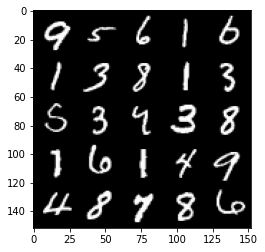

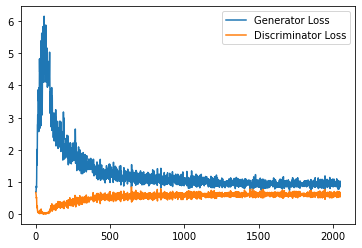

Epoch 88, step 41500: Generator loss: 0.9277928586006164, discriminator loss: 0.6099560099244118


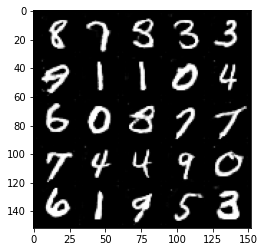

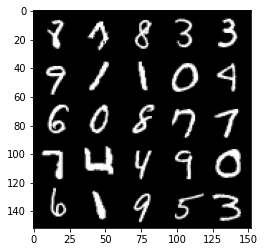

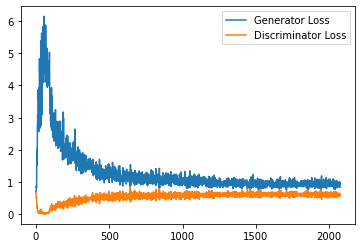

Epoch 89, step 42000: Generator loss: 0.9611679028272628, discriminator loss: 0.6133550187945366


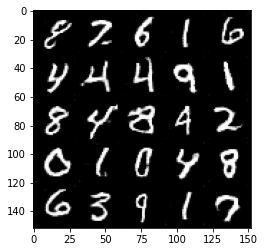

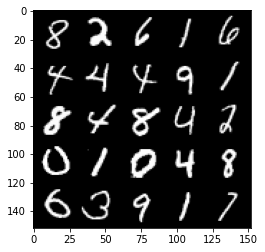

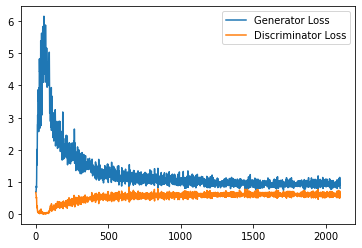

Epoch 90, step 42500: Generator loss: 0.9412106614112854, discriminator loss: 0.6097543339729309


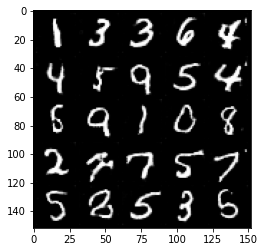

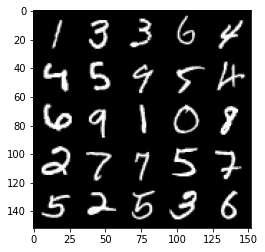

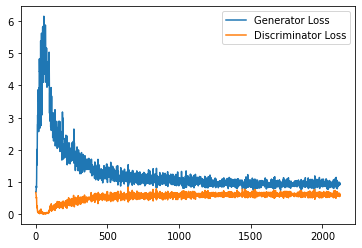

Epoch 91, step 43000: Generator loss: 0.9522675623893738, discriminator loss: 0.6129552502036094


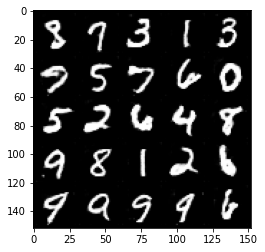

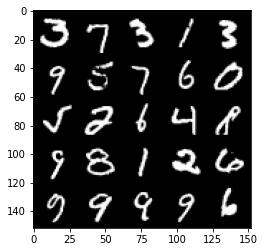

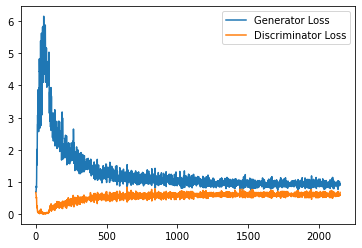

Epoch 92, step 43500: Generator loss: 0.9545168422460556, discriminator loss: 0.6058231976628303


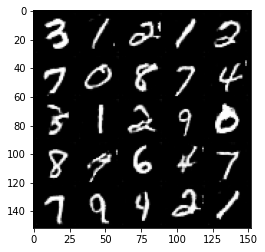

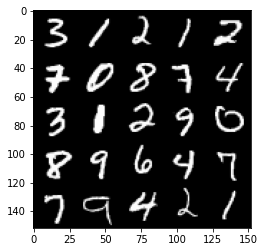

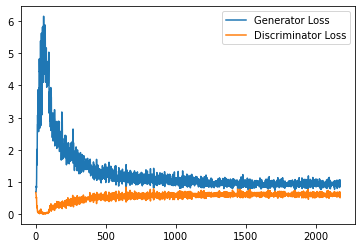

Epoch 93, step 44000: Generator loss: 0.9539948201179504, discriminator loss: 0.6122105731964111


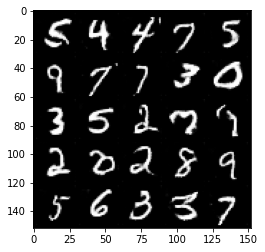

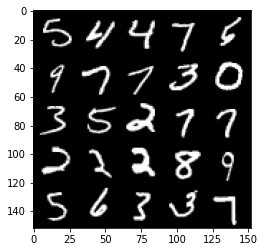

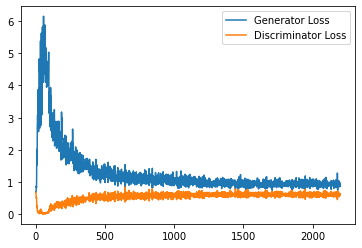

Epoch 94, step 44500: Generator loss: 0.9610673087835312, discriminator loss: 0.6065464775562286


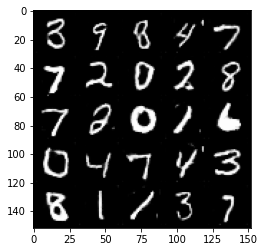

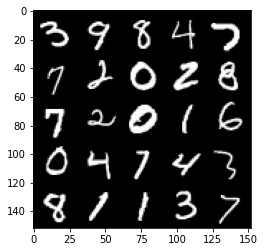

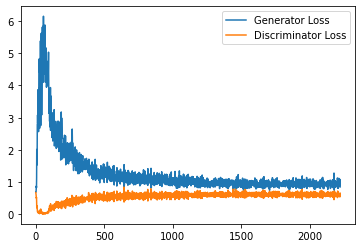

Epoch 95, step 45000: Generator loss: 0.9523040481805801, discriminator loss: 0.6073691985607147


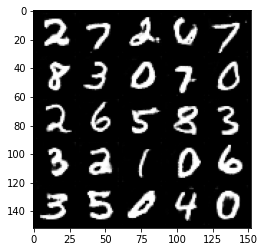

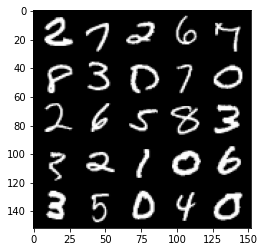

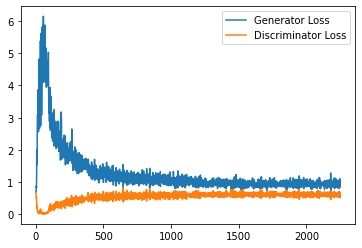

Epoch 97, step 45500: Generator loss: 0.9623626362085342, discriminator loss: 0.6120532231926918


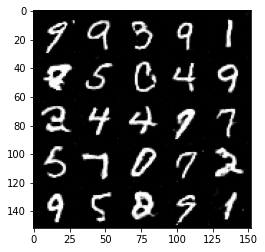

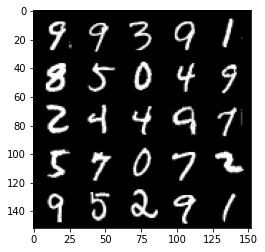

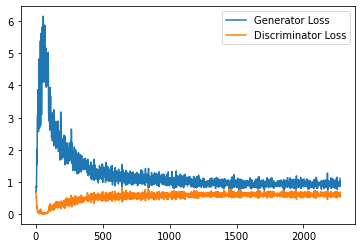

Epoch 98, step 46000: Generator loss: 0.959865870475769, discriminator loss: 0.6074414025545121


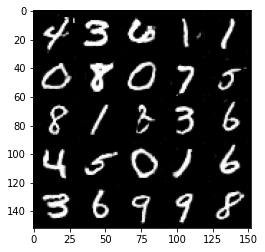

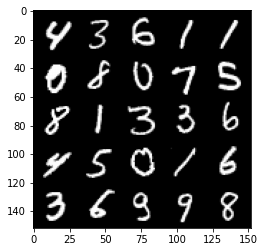

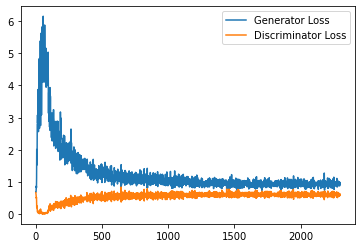

Epoch 99, step 46500: Generator loss: 0.9787368662357331, discriminator loss: 0.6037792877554894


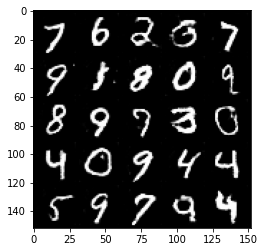

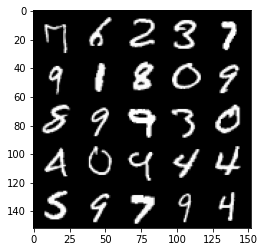

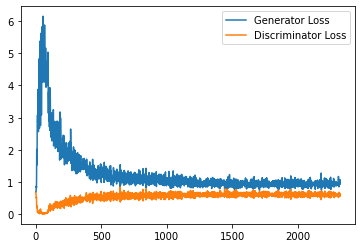

Epoch 100, step 47000: Generator loss: 0.9469781087636948, discriminator loss: 0.607471347630024


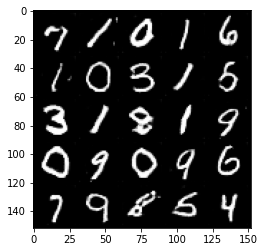

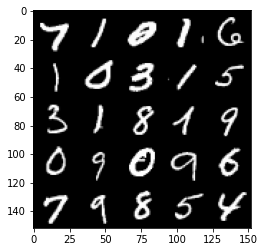

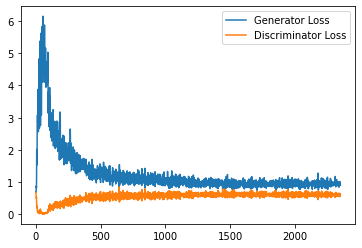

Epoch 101, step 47500: Generator loss: 0.9670026634931564, discriminator loss: 0.6029647643566132


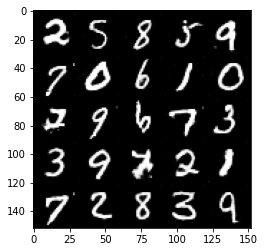

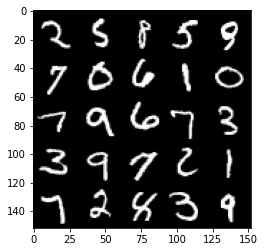

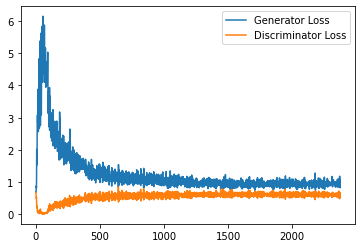

Epoch 102, step 48000: Generator loss: 0.9817287853956222, discriminator loss: 0.6028480668067933


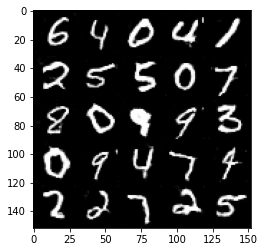

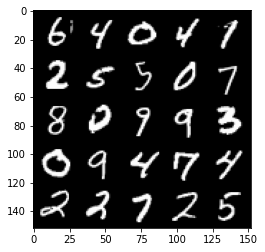

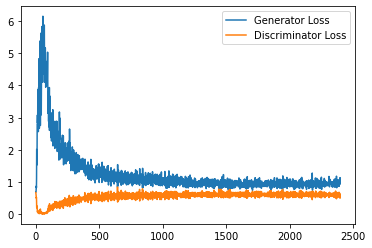

Epoch 103, step 48500: Generator loss: 0.9539546945095062, discriminator loss: 0.6069426798820495


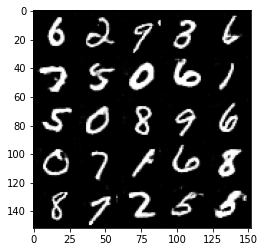

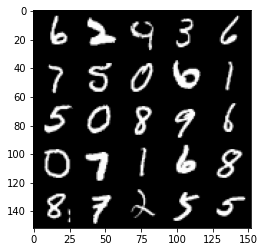

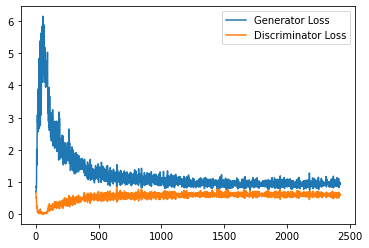

Epoch 104, step 49000: Generator loss: 0.956498640537262, discriminator loss: 0.6021617183685303


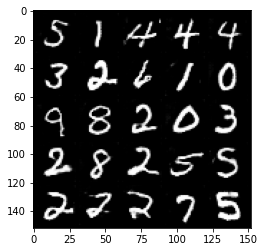

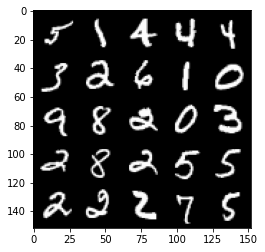

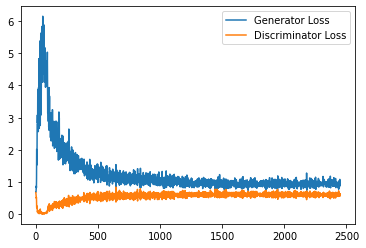

Epoch 105, step 49500: Generator loss: 0.9613172053098679, discriminator loss: 0.6022984378933907


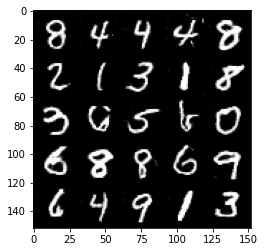

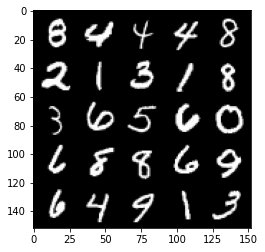

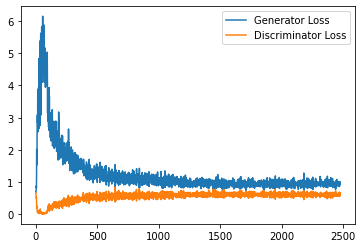

Epoch 106, step 50000: Generator loss: 0.9704696290493011, discriminator loss: 0.6022076120376587


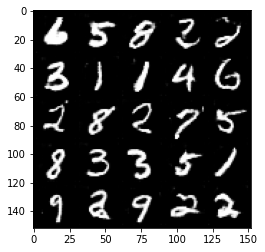

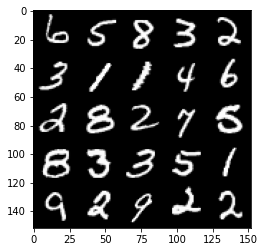

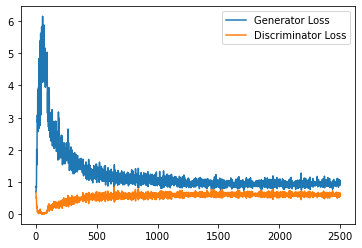

Epoch 107, step 50500: Generator loss: 0.9816882213354111, discriminator loss: 0.598817837536335


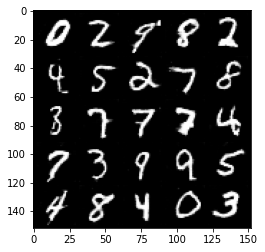

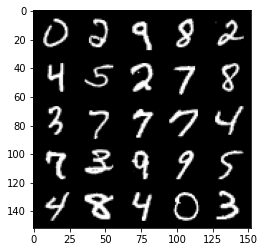

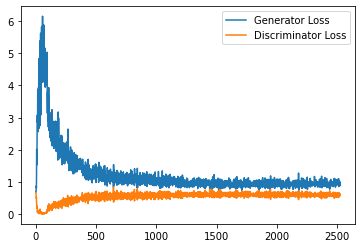

Epoch 108, step 51000: Generator loss: 0.9669338620901108, discriminator loss: 0.601118995308876


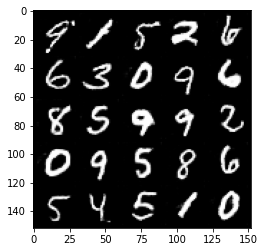

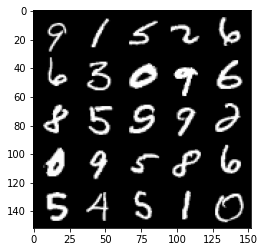

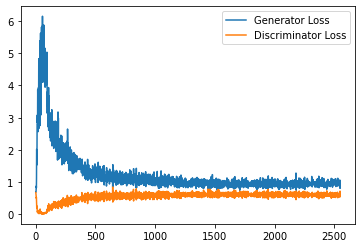

Epoch 109, step 51500: Generator loss: 0.9760978084802627, discriminator loss: 0.5997688140273094


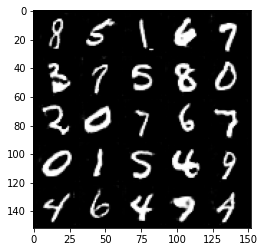

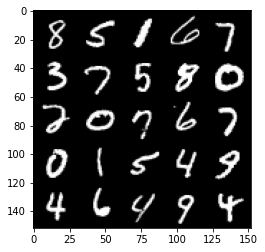

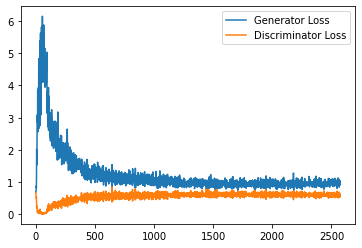

Epoch 110, step 52000: Generator loss: 0.9580681869983673, discriminator loss: 0.6078423807024955


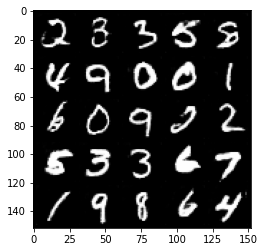

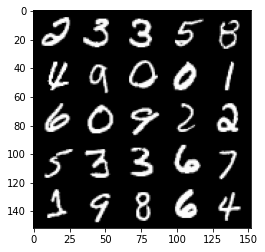

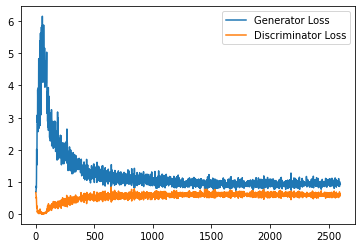

Epoch 111, step 52500: Generator loss: 0.9561815776824951, discriminator loss: 0.6021546220183372


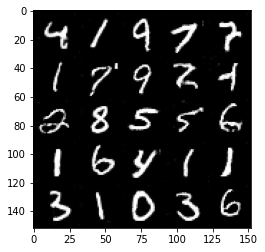

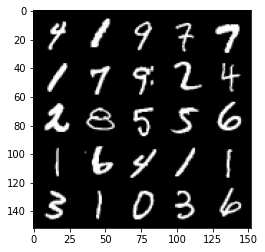

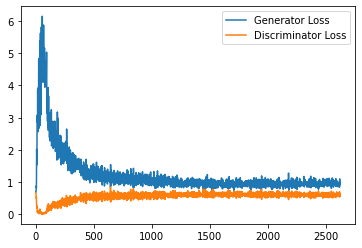

Epoch 113, step 53000: Generator loss: 0.975991180062294, discriminator loss: 0.6033088846802711


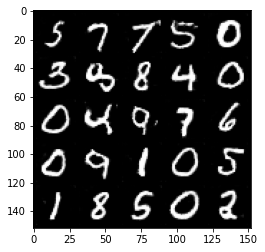

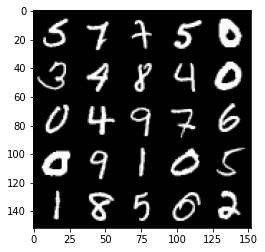

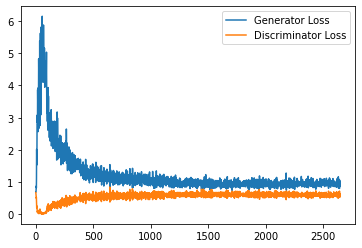

Epoch 114, step 53500: Generator loss: 0.9643344503641128, discriminator loss: 0.5997369322180748


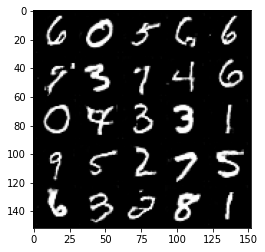

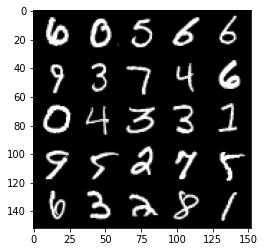

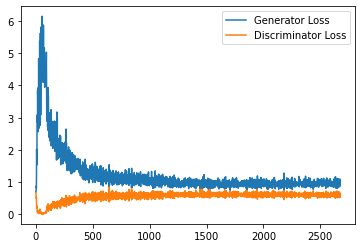

Epoch 115, step 54000: Generator loss: 0.9806296809911728, discriminator loss: 0.5995274342298508


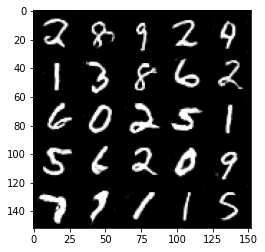

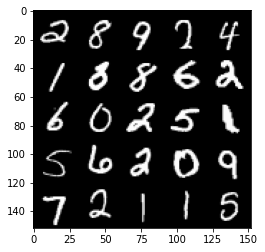

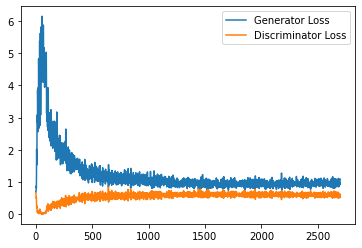

Epoch 116, step 54500: Generator loss: 0.9626489053964615, discriminator loss: 0.6070711576938629


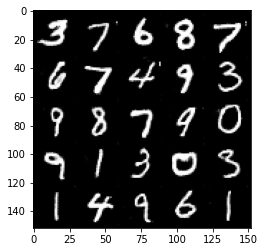

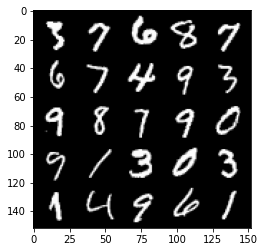

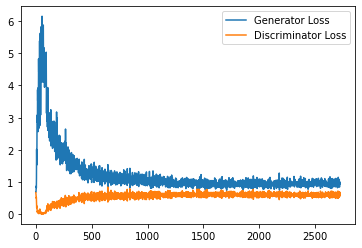

Epoch 117, step 55000: Generator loss: 0.9741374399662018, discriminator loss: 0.5944196585416793


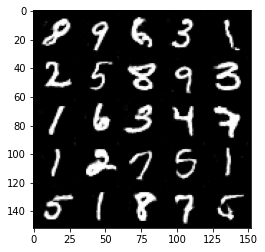

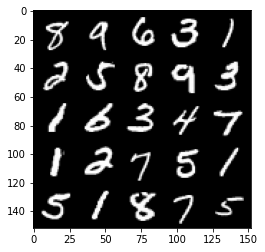

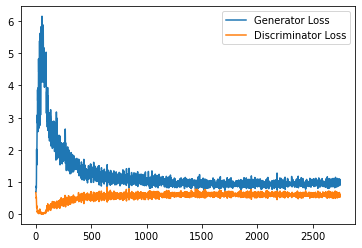

Epoch 118, step 55500: Generator loss: 0.9768102771043777, discriminator loss: 0.5997415202260017


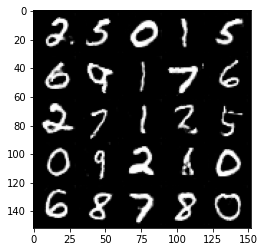

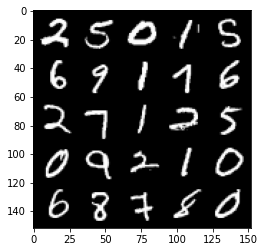

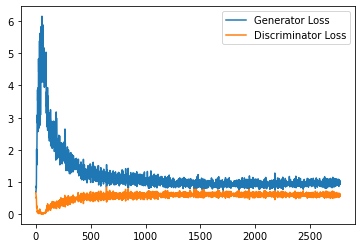

Epoch 119, step 56000: Generator loss: 0.9711902829408645, discriminator loss: 0.5974412462711334


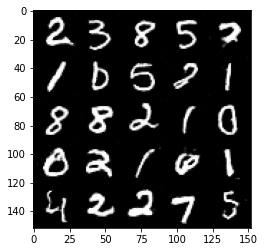

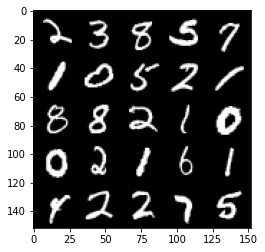

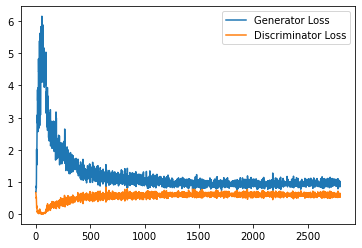

Epoch 120, step 56500: Generator loss: 0.9680378243923188, discriminator loss: 0.5980423498153686


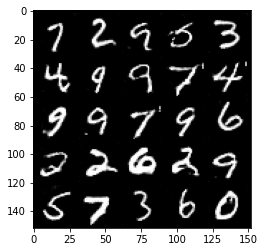

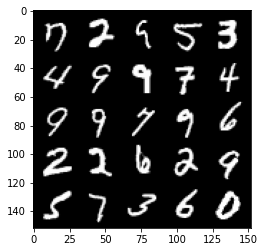

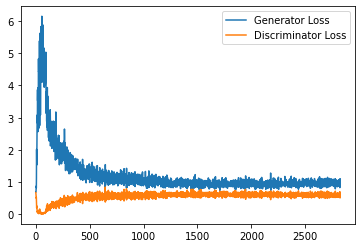

Epoch 121, step 57000: Generator loss: 0.9941769304275513, discriminator loss: 0.5982715257406235


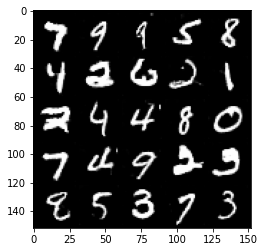

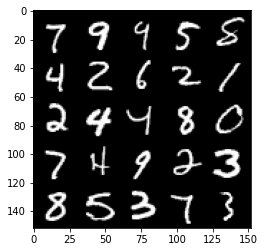

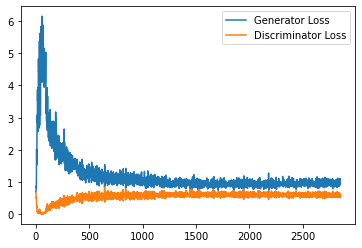

Epoch 122, step 57500: Generator loss: 1.002554894089699, discriminator loss: 0.6024845570325852


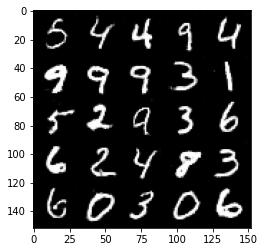

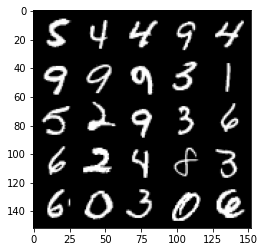

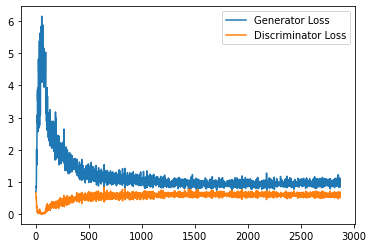

Epoch 123, step 58000: Generator loss: 0.975886368393898, discriminator loss: 0.5968294486999511


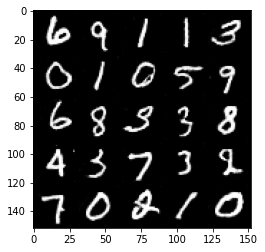

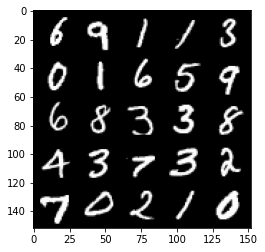

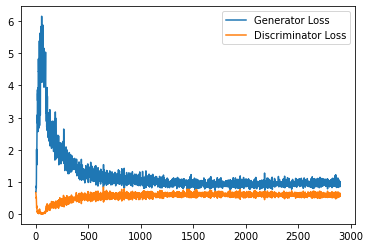

Epoch 124, step 58500: Generator loss: 0.9702001883983612, discriminator loss: 0.5986195098757744


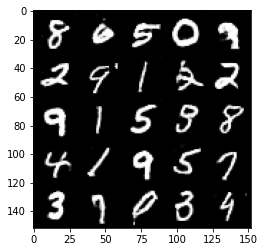

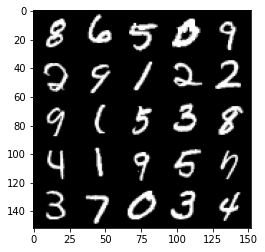

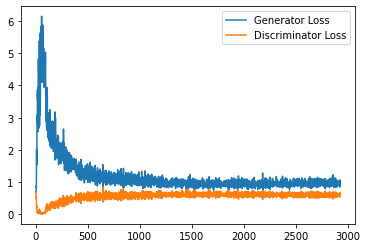

Epoch 125, step 59000: Generator loss: 0.9924973105192184, discriminator loss: 0.5959055661559105


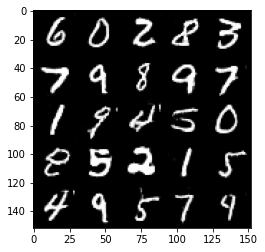

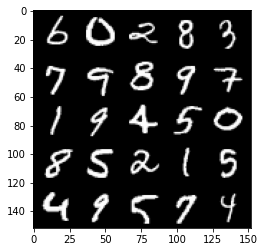

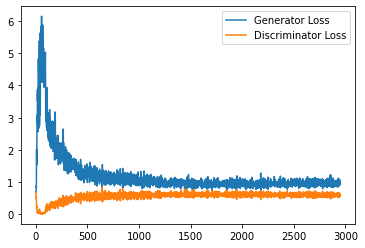

Epoch 126, step 59500: Generator loss: 0.9826340469121932, discriminator loss: 0.5978016113638878


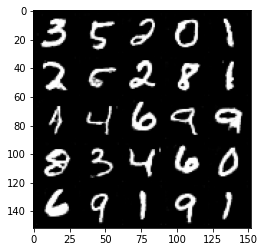

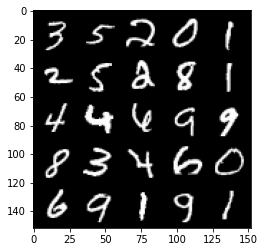

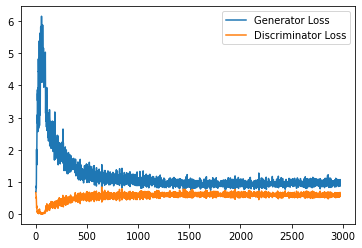

Epoch 127, step 60000: Generator loss: 0.9912350934743881, discriminator loss: 0.5922612450122833


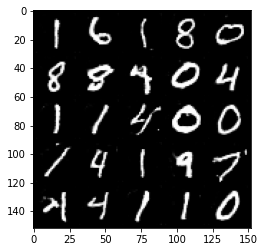

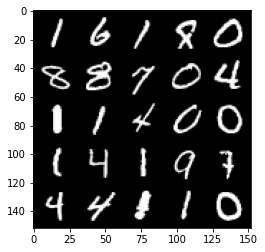

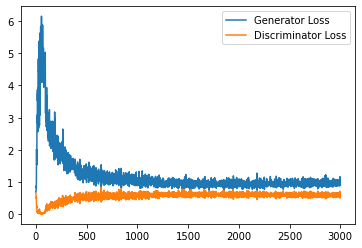

Epoch 128, step 60500: Generator loss: 0.987162204504013, discriminator loss: 0.6022061223387718


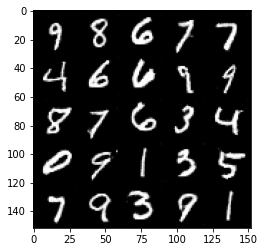

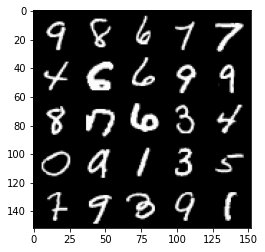

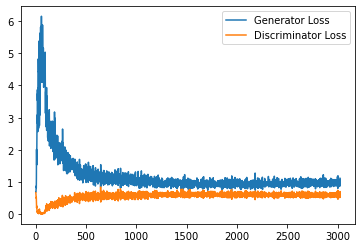

Epoch 130, step 61000: Generator loss: 0.9832547795772553, discriminator loss: 0.596951411664486


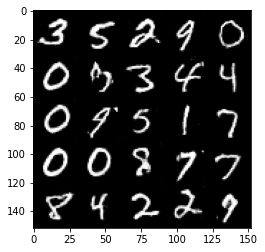

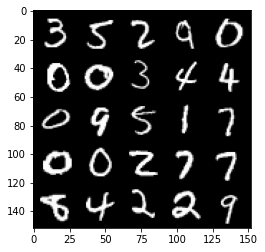

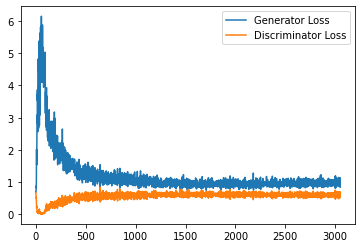

Epoch 131, step 61500: Generator loss: 0.9816086933612823, discriminator loss: 0.5956929298639297


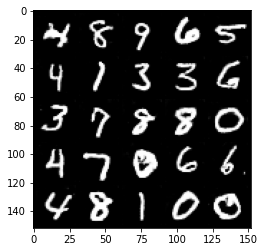

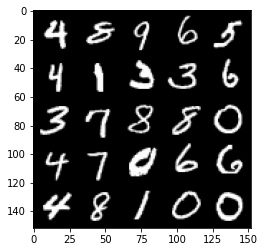

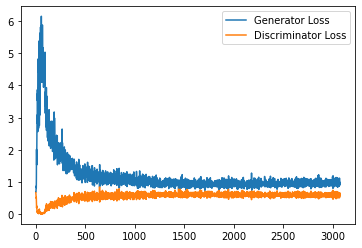

Epoch 132, step 62000: Generator loss: 0.9889650053977966, discriminator loss: 0.5984005211591721


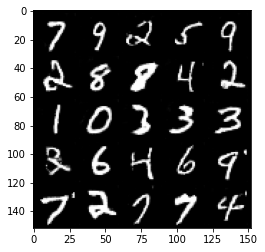

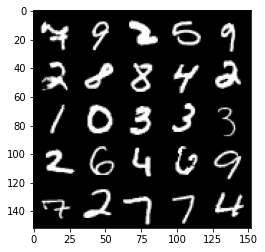

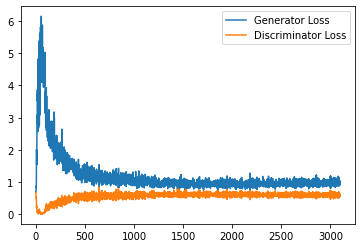

Epoch 133, step 62500: Generator loss: 0.9824396522045136, discriminator loss: 0.5967769109010697


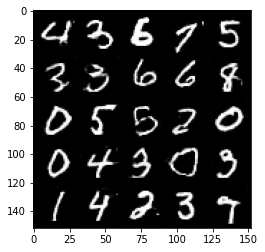

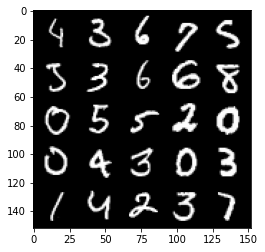

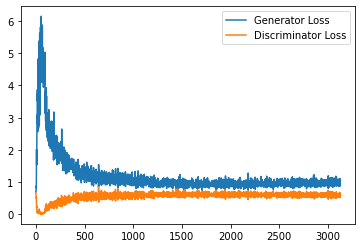

Epoch 134, step 63000: Generator loss: 0.9665040479898452, discriminator loss: 0.5967528789043427


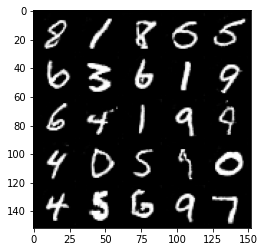

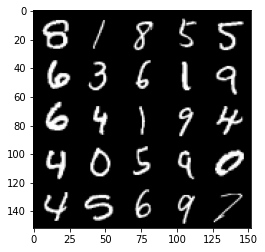

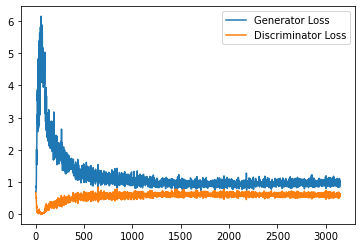

Epoch 135, step 63500: Generator loss: 0.990758194565773, discriminator loss: 0.5966890740990639


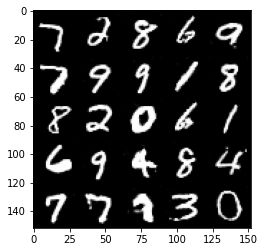

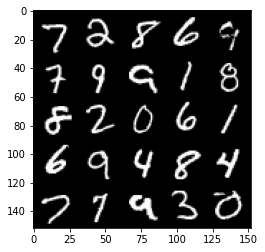

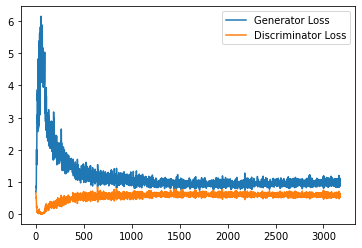

Epoch 136, step 64000: Generator loss: 0.997913685798645, discriminator loss: 0.5922278583049774


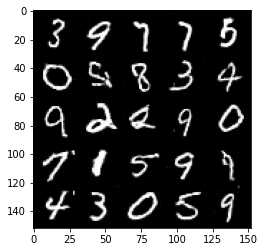

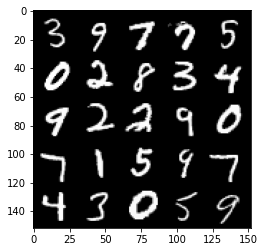

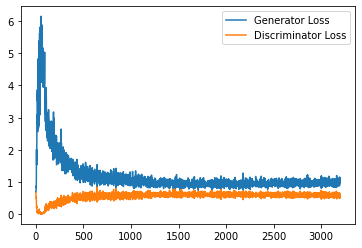

Epoch 137, step 64500: Generator loss: 0.9941126661300659, discriminator loss: 0.6024375211596489


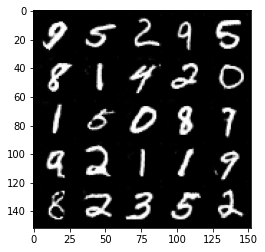

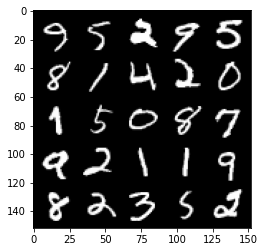

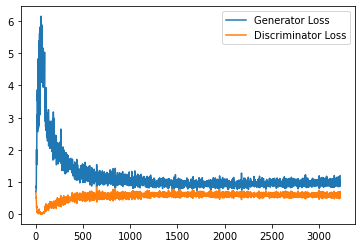

Epoch 138, step 65000: Generator loss: 0.9862486007213592, discriminator loss: 0.5971611803770065


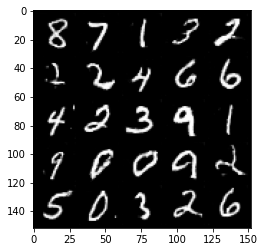

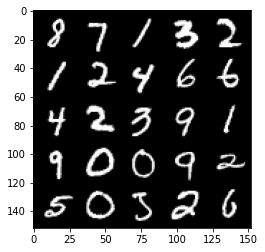

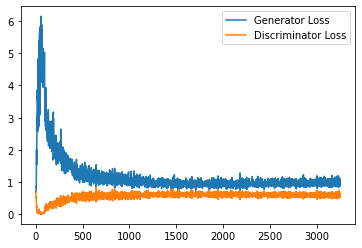

Epoch 139, step 65500: Generator loss: 0.9768105083703995, discriminator loss: 0.600685655772686


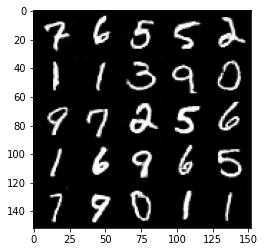

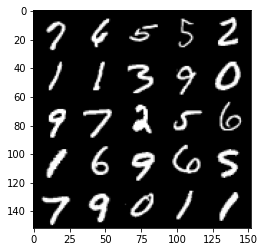

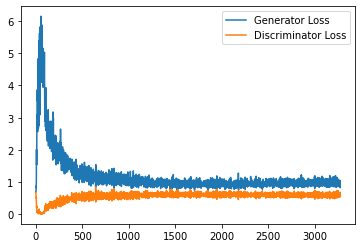

Epoch 140, step 66000: Generator loss: 0.9796406773328781, discriminator loss: 0.5956094825863838


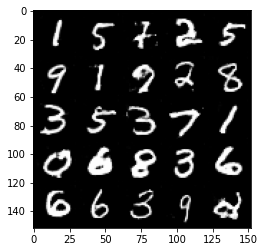

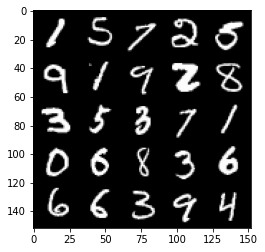

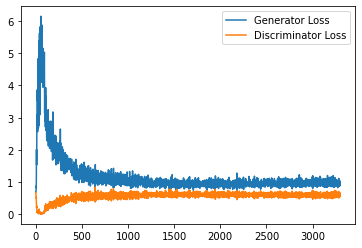

Epoch 141, step 66500: Generator loss: 0.9778034368753433, discriminator loss: 0.5989002128243446


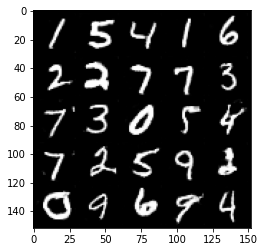

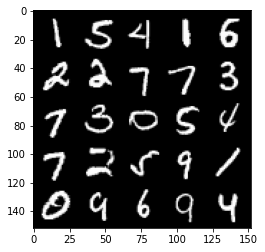

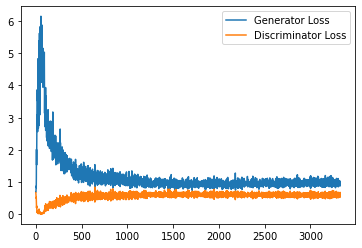

Epoch 142, step 67000: Generator loss: 0.9877202852964401, discriminator loss: 0.5949045831561088


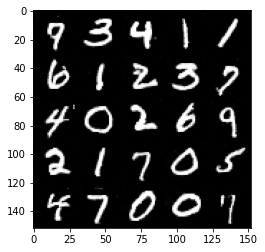

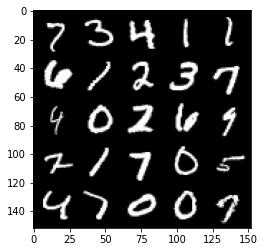

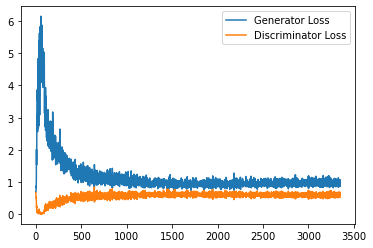

Epoch 143, step 67500: Generator loss: 0.9811768860816955, discriminator loss: 0.5969870601296425


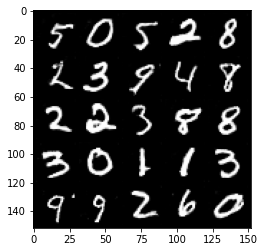

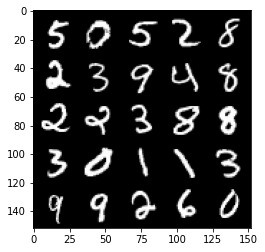

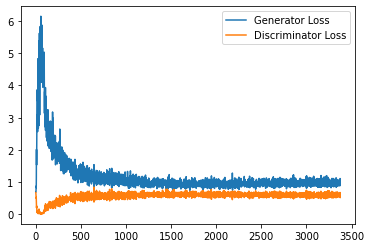

Epoch 144, step 68000: Generator loss: 0.988796209692955, discriminator loss: 0.5938351283073425


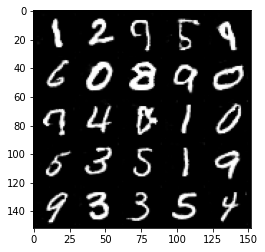

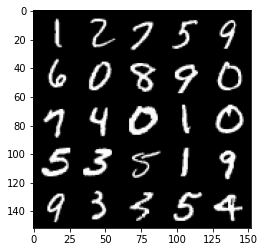

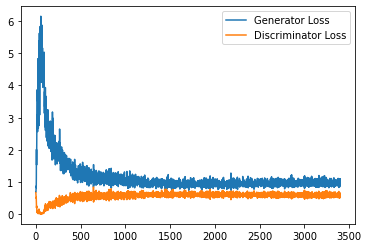

Epoch 146, step 68500: Generator loss: 0.9931127408742905, discriminator loss: 0.6025810394883155


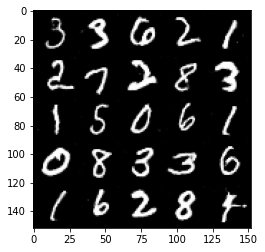

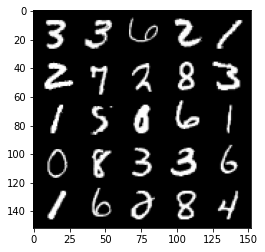

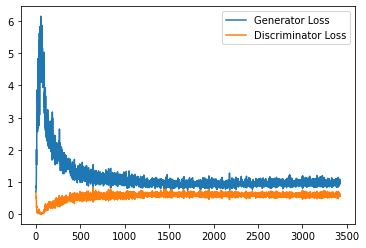

Epoch 147, step 69000: Generator loss: 0.9867366857528687, discriminator loss: 0.5981289989352226


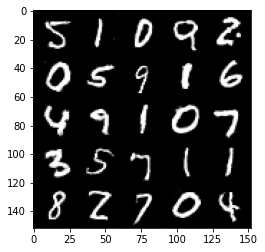

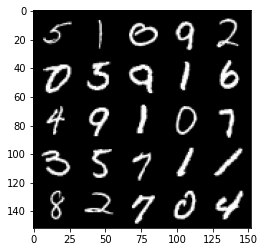

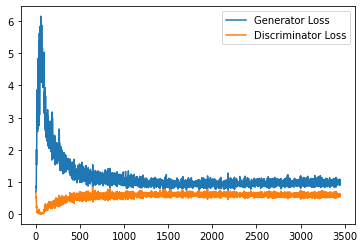

Epoch 148, step 69500: Generator loss: 0.9961371344327926, discriminator loss: 0.5958930057883263


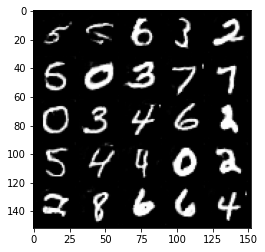

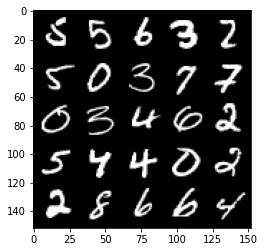

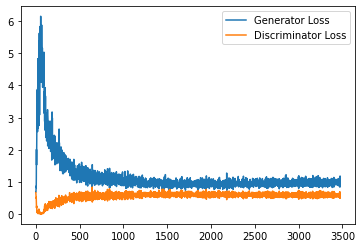

Epoch 149, step 70000: Generator loss: 0.9842026153802872, discriminator loss: 0.6014489774703979


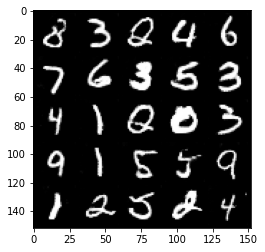

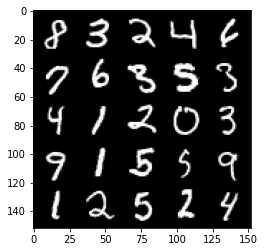

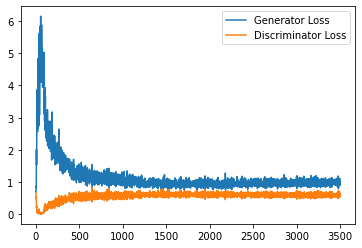

Epoch 150, step 70500: Generator loss: 0.9917030664682388, discriminator loss: 0.6017462482452393


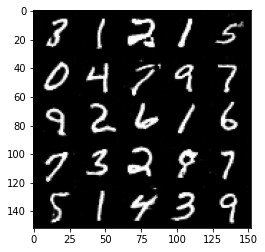

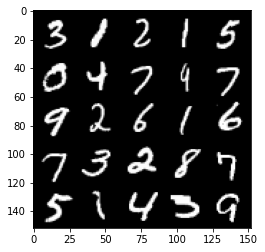

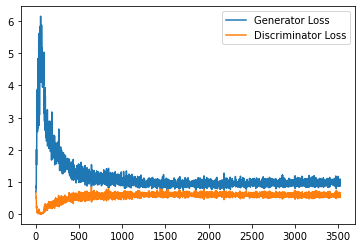

Epoch 151, step 71000: Generator loss: 0.9793130011558533, discriminator loss: 0.5963652952313423


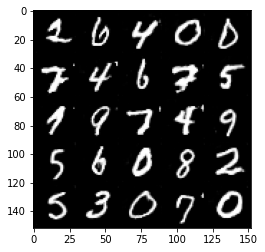

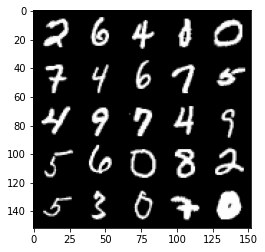

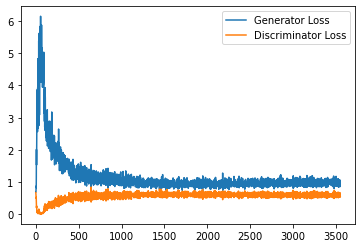

Epoch 152, step 71500: Generator loss: 0.9715725961923599, discriminator loss: 0.6041382427215576


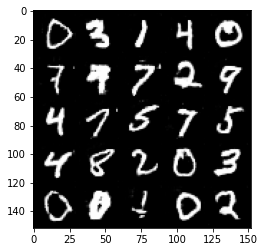

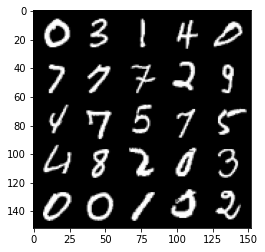

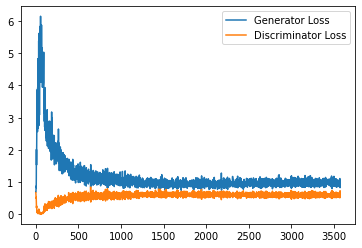

Epoch 153, step 72000: Generator loss: 1.013042897105217, discriminator loss: 0.6034679487943649


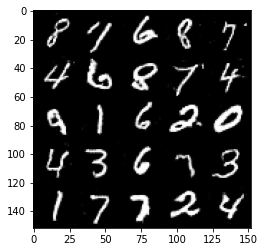

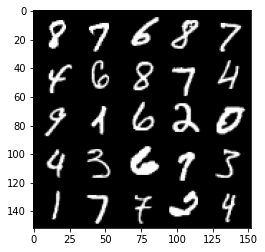

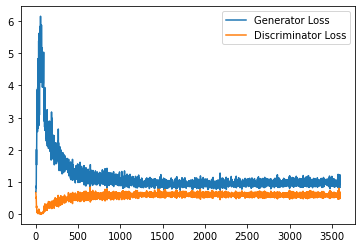

Epoch 154, step 72500: Generator loss: 0.9791089206933975, discriminator loss: 0.6029085245132446


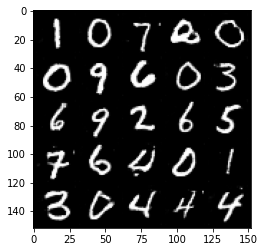

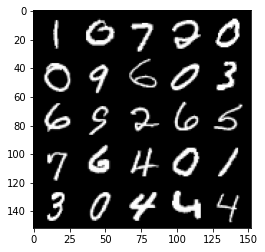

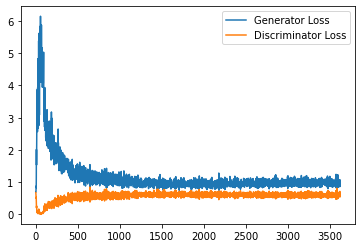

Epoch 155, step 73000: Generator loss: 0.9847533552646637, discriminator loss: 0.6007462764978408


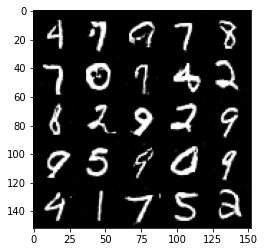

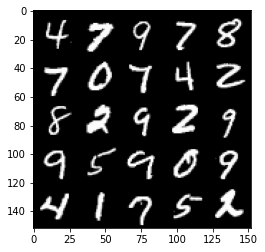

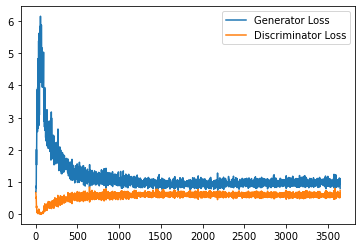

Epoch 156, step 73500: Generator loss: 0.9921024998426438, discriminator loss: 0.6003385537266731


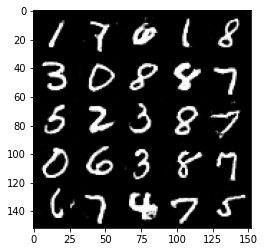

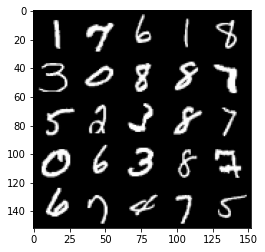

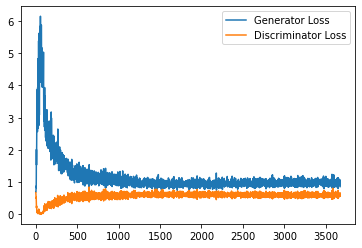

Epoch 157, step 74000: Generator loss: 0.9873150825500489, discriminator loss: 0.5974628110527992


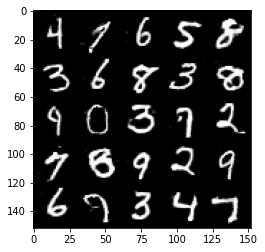

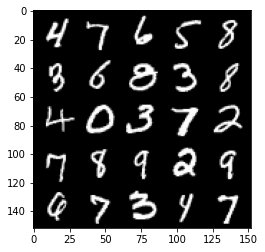

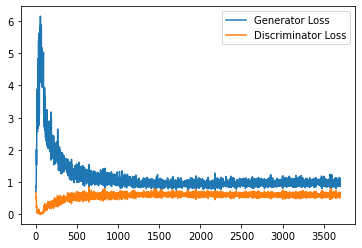

Epoch 158, step 74500: Generator loss: 0.9646190083026887, discriminator loss: 0.601037090241909


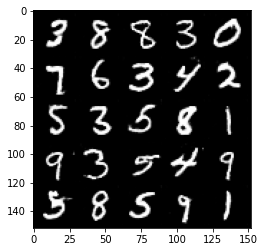

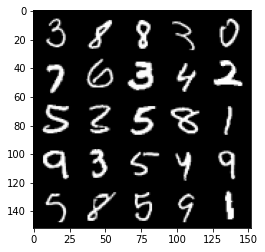

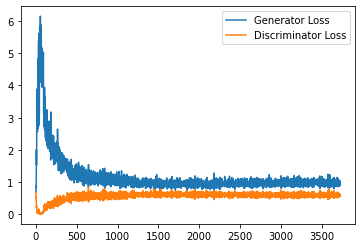

Epoch 159, step 75000: Generator loss: 0.9882140526771546, discriminator loss: 0.6051482577323913


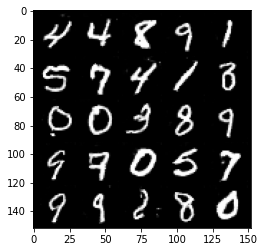

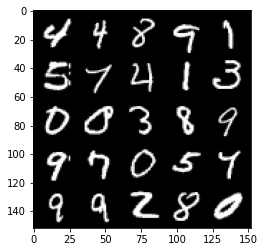

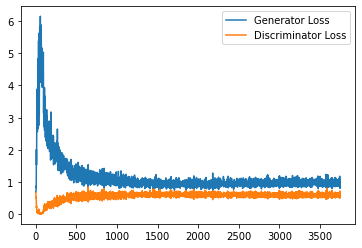

Epoch 160, step 75500: Generator loss: 0.9783280103206634, discriminator loss: 0.6035350568294525


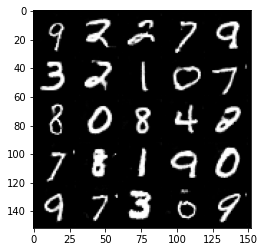

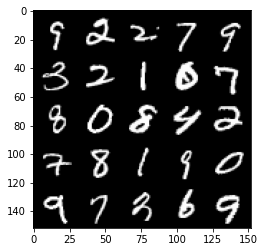

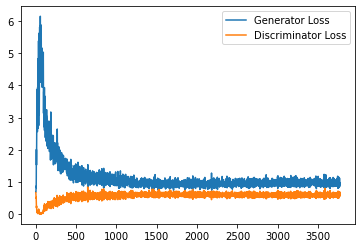

Epoch 162, step 76000: Generator loss: 0.9869123570919037, discriminator loss: 0.603912858247757


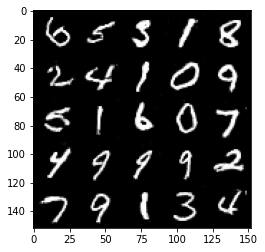

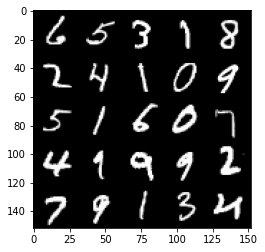

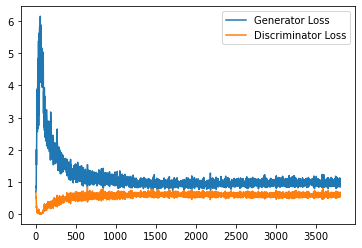

Epoch 163, step 76500: Generator loss: 0.9868498163223267, discriminator loss: 0.601169901072979


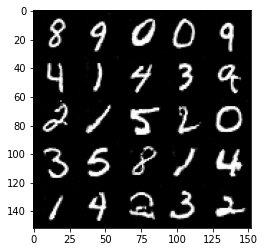

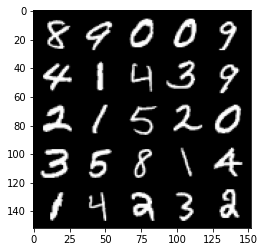

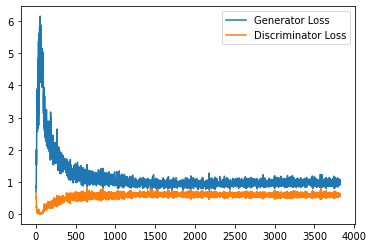

Epoch 164, step 77000: Generator loss: 0.9861472156047821, discriminator loss: 0.6042343409061431


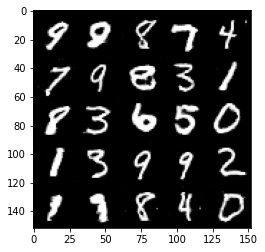

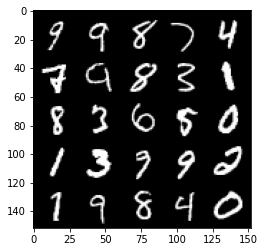

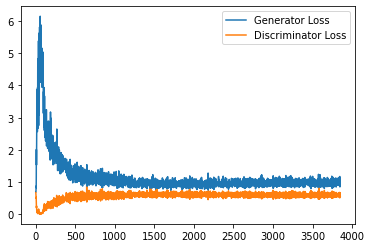

Epoch 165, step 77500: Generator loss: 0.9778733971118927, discriminator loss: 0.6069748550653458


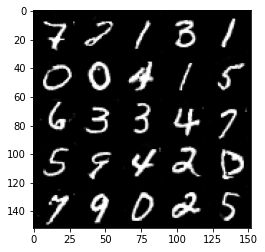

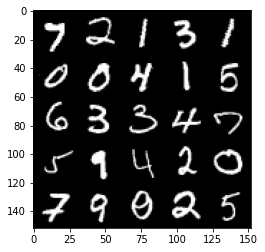

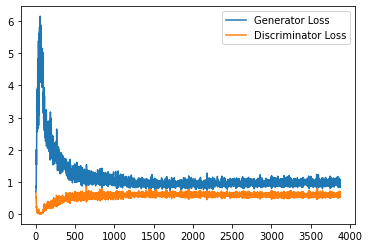

Epoch 166, step 78000: Generator loss: 0.97159594643116, discriminator loss: 0.6050908576250076


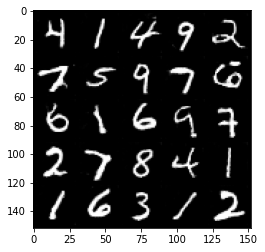

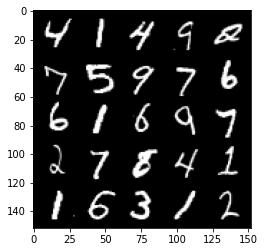

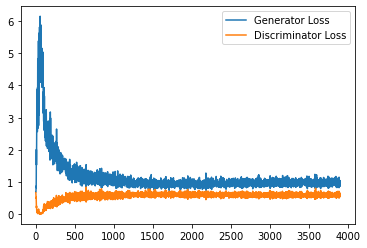

Epoch 167, step 78500: Generator loss: 0.9971076227426529, discriminator loss: 0.5966072663664818


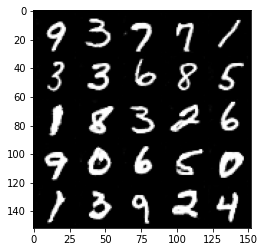

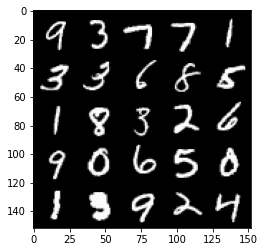

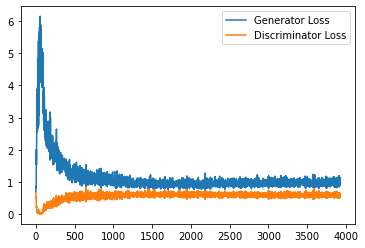

Epoch 168, step 79000: Generator loss: 0.996054294705391, discriminator loss: 0.6067186275720596


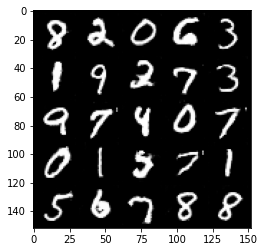

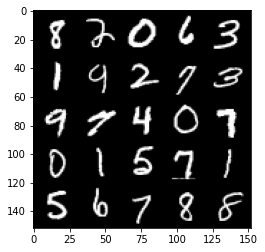

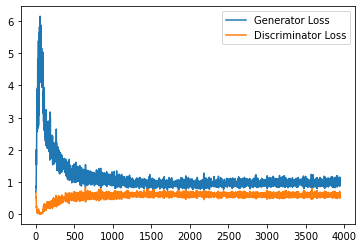

Epoch 169, step 79500: Generator loss: 0.9752674154043197, discriminator loss: 0.6075568227171898


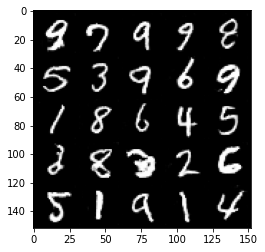

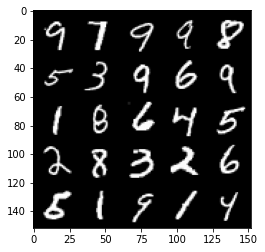

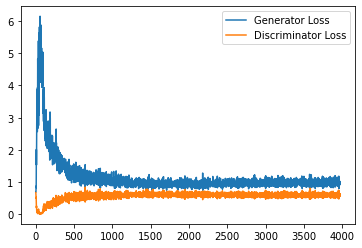

Epoch 170, step 80000: Generator loss: 0.9797627919912338, discriminator loss: 0.604839054107666


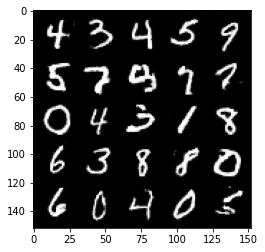

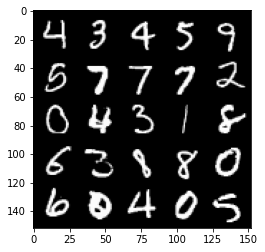

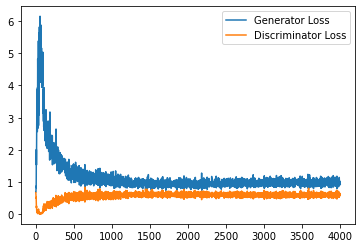

Epoch 171, step 80500: Generator loss: 0.9808032953739166, discriminator loss: 0.6082675358653069


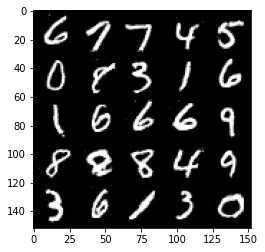

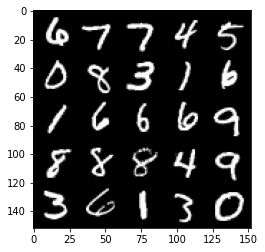

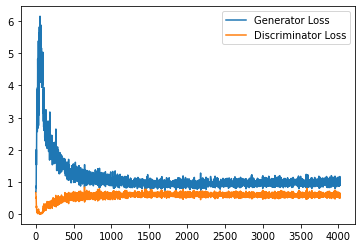

Epoch 172, step 81000: Generator loss: 0.9916815234422683, discriminator loss: 0.6046111169457435


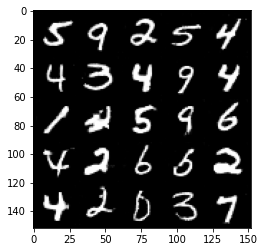

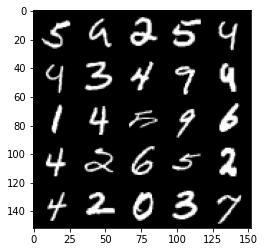

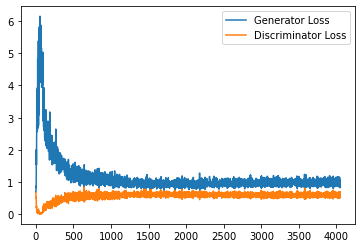

Epoch 173, step 81500: Generator loss: 0.966178897857666, discriminator loss: 0.6070241329073905


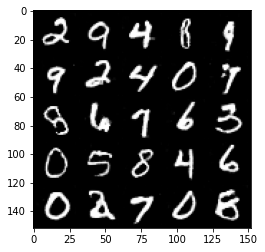

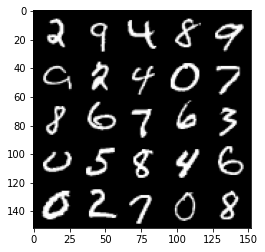

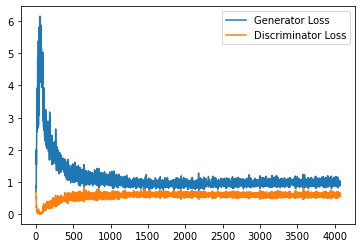

Epoch 174, step 82000: Generator loss: 0.9762125977277756, discriminator loss: 0.6041771032214165


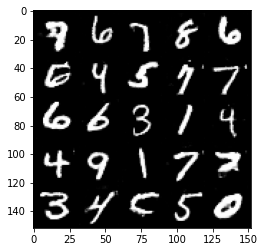

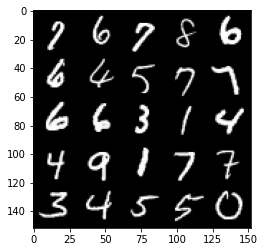

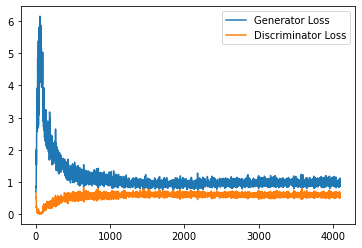

Epoch 175, step 82500: Generator loss: 0.9768043307065963, discriminator loss: 0.6105645557641983


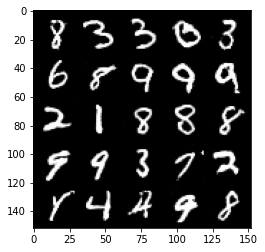

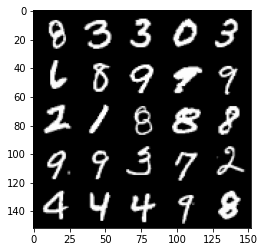

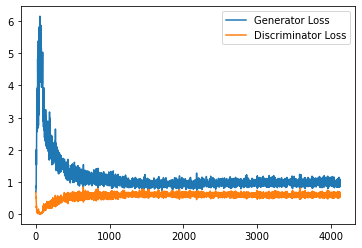

Epoch 176, step 83000: Generator loss: 0.9718222539424897, discriminator loss: 0.6107776908874512


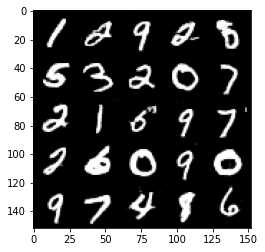

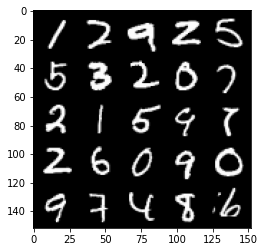

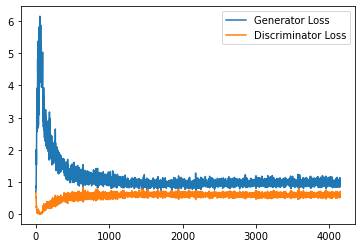

Epoch 178, step 83500: Generator loss: 0.9639435336589813, discriminator loss: 0.6080643706917763


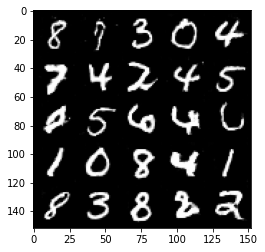

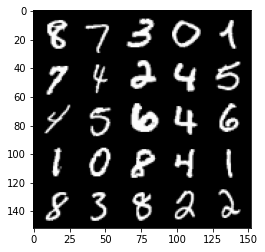

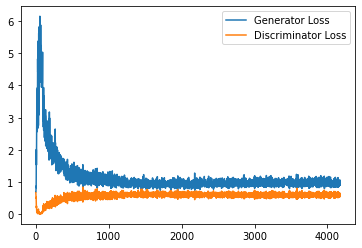

Epoch 179, step 84000: Generator loss: 0.968139634847641, discriminator loss: 0.6123572282195091


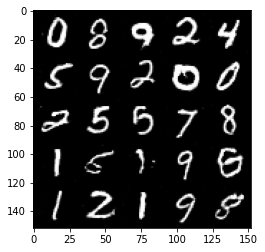

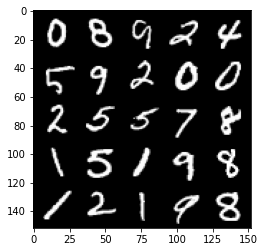

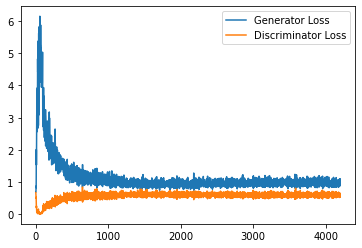

Epoch 180, step 84500: Generator loss: 0.9625777860879898, discriminator loss: 0.6081807487010956


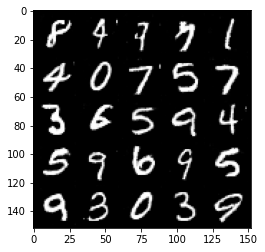

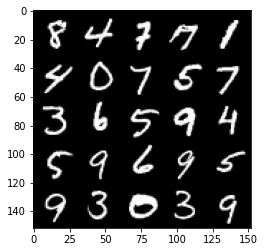

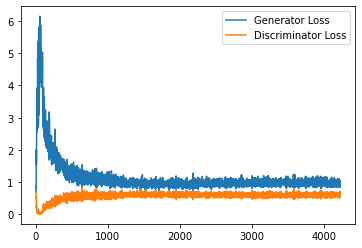

Epoch 181, step 85000: Generator loss: 0.9829383062124253, discriminator loss: 0.6075243046879768


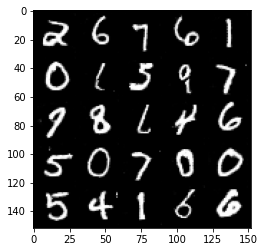

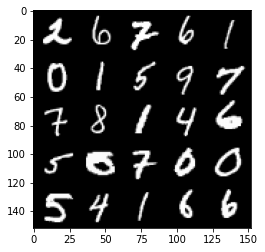

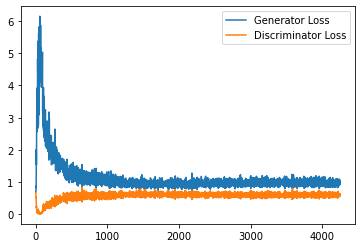

Epoch 182, step 85500: Generator loss: 0.9585969576835632, discriminator loss: 0.6131525208353996


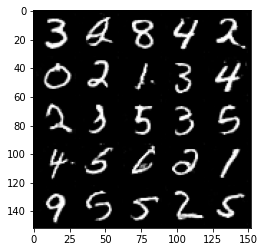

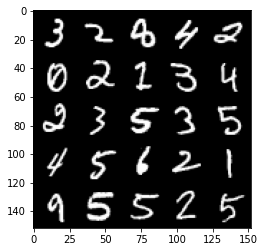

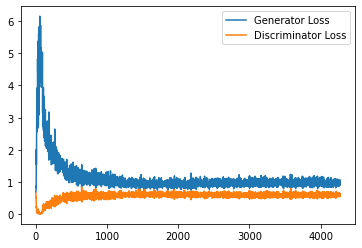

Epoch 183, step 86000: Generator loss: 0.9573586294651032, discriminator loss: 0.6147467914223671


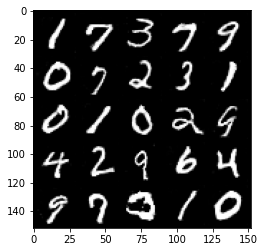

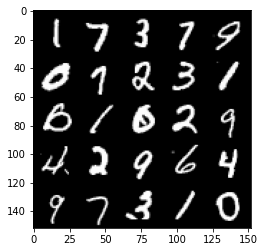

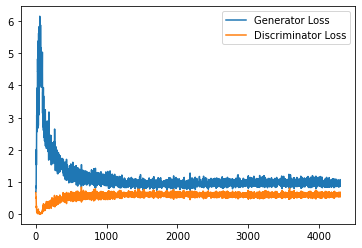

Epoch 184, step 86500: Generator loss: 0.9725277862548828, discriminator loss: 0.6159971069097518


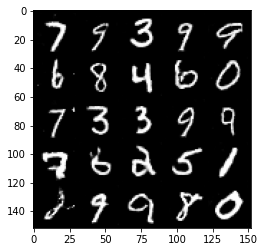

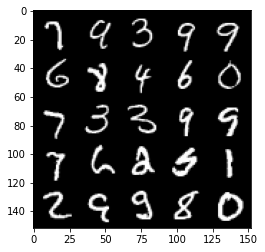

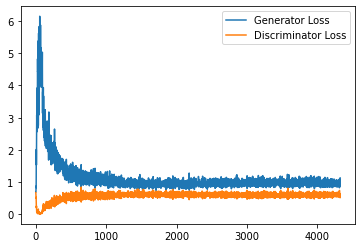

In [ ]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED CELL
cur_step = 0
generator_losses = []
discriminator_losses = []

#UNIT TEST NOTE: Initializations needed for grading
noise_and_labels = False
fake = False

fake_image_and_labels = False
real_image_and_labels = False
disc_fake_pred = False
disc_real_pred = False

for epoch in range(n_epochs):
    # Dataloader returns the batches and the labels
    for real, labels in tqdm(dataloader):
        cur_batch_size = len(real)
        # Flatten the batch of real images from the dataset
        real = real.to(device)

        one_hot_labels = get_one_hot_labels(labels.to(device), n_classes)
        image_one_hot_labels = one_hot_labels[:, :, None, None]
        image_one_hot_labels = image_one_hot_labels.repeat(1, 1, mnist_shape[1], mnist_shape[2])

        ### Update discriminator ###
        # Zero out the discriminator gradients
        disc_opt.zero_grad()
        # Get noise corresponding to the current batch_size 
        fake_noise = get_noise(cur_batch_size, z_dim, device=device)
        
        # Now you can get the images from the generator
        # Steps: 1) Combine the noise vectors and the one-hot labels for the generator
        #        2) Generate the conditioned fake images
       
        #### START CODE HERE ####
        noise_and_labels = combine_vectors(fake_noise, one_hot_labels)
        fake = gen(noise_and_labels)
        #### END CODE HERE ####
        
        # Make sure that enough images were generated
        assert len(fake) == len(real)
        # Check that correct tensors were combined
        assert tuple(noise_and_labels.shape) == (cur_batch_size, fake_noise.shape[1] + one_hot_labels.shape[1])
        # It comes from the correct generator
        assert tuple(fake.shape) == (len(real), 1, 28, 28)

        # Now you can get the predictions from the discriminator
        # Steps: 1) Create the input for the discriminator
        #           a) Combine the fake images with image_one_hot_labels, 
        #              remember to detach the generator (.detach()) so you do not backpropagate through it
        #           b) Combine the real images with image_one_hot_labels
        #        2) Get the discriminator's prediction on the fakes as disc_fake_pred
        #        3) Get the discriminator's prediction on the reals as disc_real_pred
        
        #### START CODE HERE ####
        fake_image_and_labels = combine_vectors(fake.detach(), image_one_hot_labels)
        real_image_and_labels = combine_vectors(real, image_one_hot_labels)
        disc_fake_pred = disc(fake_image_and_labels)
        disc_real_pred = disc(real_image_and_labels)
        #### END CODE HERE ####
        
        # Make sure shapes are correct 
        assert tuple(fake_image_and_labels.shape) == (len(real), fake.detach().shape[1] + image_one_hot_labels.shape[1], 28 ,28)
        assert tuple(real_image_and_labels.shape) == (len(real), real.shape[1] + image_one_hot_labels.shape[1], 28 ,28)
        # Make sure that enough predictions were made
        assert len(disc_real_pred) == len(real)
        # Make sure that the inputs are different
        assert torch.any(fake_image_and_labels != real_image_and_labels)
        # Shapes must match
        assert tuple(fake_image_and_labels.shape) == tuple(real_image_and_labels.shape)
        assert tuple(disc_fake_pred.shape) == tuple(disc_real_pred.shape)
        
        
        disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
        disc_loss = (disc_fake_loss + disc_real_loss) / 2
        disc_loss.backward(retain_graph=True)
        disc_opt.step() 

        # Keep track of the average discriminator loss
        discriminator_losses += [disc_loss.item()]

        ### Update generator ###
        # Zero out the generator gradients
        gen_opt.zero_grad()

        fake_image_and_labels = combine_vectors(fake, image_one_hot_labels)
        # This will error if you didn't concatenate your labels to your image correctly
        disc_fake_pred = disc(fake_image_and_labels)
        gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
        gen_loss.backward()
        gen_opt.step()

        # Keep track of the generator losses
        generator_losses += [gen_loss.item()]
        #

        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            disc_mean = sum(discriminator_losses[-display_step:]) / display_step
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {gen_mean}, discriminator loss: {disc_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            x_axis = sorted([i * step_bins for i in range(len(generator_losses) // step_bins)] * step_bins)
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(discriminator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Discriminator Loss"
            )
            plt.legend()
            plt.show()
        elif cur_step == 0:
            print("Congratulations! If you've gotten here, it's working. Please let this train until you're happy with how the generated numbers look, and then go on to the exploration!")
        cur_step += 1

## Exploration
You can do a bit of exploration now!

In [ ]:
# Before you explore, you should put the generator
# in eval mode, both in general and so that batch norm
# doesn't cause you issues and is using its eval statistics
gen = gen.eval()

#### Changing the Class Vector
You can generate some numbers with your new model! You can add interpolation as well to make it more interesting.

So starting from a image, you will produce intermediate images that look more and more like the ending image until you get to the final image. Your're basically morphing one image into another. You can choose what these two images will be using your conditional GAN.

In [ ]:
import math

### Change me! ###
n_interpolation = 9 # Choose the interpolation: how many intermediate images you want + 2 (for the start and end image)
interpolation_noise = get_noise(1, z_dim, device=device).repeat(n_interpolation, 1)

def interpolate_class(first_number, second_number):
    first_label = get_one_hot_labels(torch.Tensor([first_number]).long(), n_classes)
    second_label = get_one_hot_labels(torch.Tensor([second_number]).long(), n_classes)

    # Calculate the interpolation vector between the two labels
    percent_second_label = torch.linspace(0, 1, n_interpolation)[:, None]
    interpolation_labels = first_label * (1 - percent_second_label) + second_label * percent_second_label

    # Combine the noise and the labels
    noise_and_labels = combine_vectors(interpolation_noise, interpolation_labels.to(device))
    fake = gen(noise_and_labels)
    show_tensor_images(fake, num_images=n_interpolation, nrow=int(math.sqrt(n_interpolation)), show=False)

### Change me! ###
start_plot_number = 1 # Choose the start digit
### Change me! ###
end_plot_number = 5 # Choose the end digit

plt.figure(figsize=(8, 8))
interpolate_class(start_plot_number, end_plot_number)
_ = plt.axis('off')

### Uncomment the following lines of code if you would like to visualize a set of pairwise class 
### interpolations for a collection of different numbers, all in a single grid of interpolations.
### You'll also see another visualization like this in the next code block!
# plot_numbers = [2, 3, 4, 5, 7]
# n_numbers = len(plot_numbers)
# plt.figure(figsize=(8, 8))
# for i, first_plot_number in enumerate(plot_numbers):
#     for j, second_plot_number in enumerate(plot_numbers):
#         plt.subplot(n_numbers, n_numbers, i * n_numbers + j + 1)
#         interpolate_class(first_plot_number, second_plot_number)
#         plt.axis('off')
# plt.subplots_adjust(top=1, bottom=0, left=0, right=1, hspace=0.1, wspace=0)
# plt.show()
# plt.close()

#### Changing the Noise Vector
Now, what happens if you hold the class constant, but instead you change the noise vector? You can also interpolate the noise vector and generate an image at each step.

In [ ]:
n_interpolation = 9 # How many intermediate images you want + 2 (for the start and end image)

# This time you're interpolating between the noise instead of the labels
interpolation_label = get_one_hot_labels(torch.Tensor([5]).long(), n_classes).repeat(n_interpolation, 1).float()

def interpolate_noise(first_noise, second_noise):
    # This time you're interpolating between the noise instead of the labels
    percent_first_noise = torch.linspace(0, 1, n_interpolation)[:, None].to(device)
    interpolation_noise = first_noise * percent_first_noise + second_noise * (1 - percent_first_noise)

    # Combine the noise and the labels again
    noise_and_labels = combine_vectors(interpolation_noise, interpolation_label.to(device))
    fake = gen(noise_and_labels)
    show_tensor_images(fake, num_images=n_interpolation, nrow=int(math.sqrt(n_interpolation)), show=False)

# Generate noise vectors to interpolate between
### Change me! ###
n_noise = 5 # Choose the number of noise examples in the grid
plot_noises = [get_noise(1, z_dim, device=device) for i in range(n_noise)]
plt.figure(figsize=(8, 8))
for i, first_plot_noise in enumerate(plot_noises):
    for j, second_plot_noise in enumerate(plot_noises):
        plt.subplot(n_noise, n_noise, i * n_noise + j + 1)
        interpolate_noise(first_plot_noise, second_plot_noise)
        plt.axis('off')
plt.subplots_adjust(top=1, bottom=0, left=0, right=1, hspace=0.1, wspace=0)
plt.show()
plt.close()